In [1]:
import os
import numpy as np
import xarray as xr
import pandas as pd
import seaborn as sns
import geopandas as gpd

import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cf

import scipy.stats as stats
from scipy.stats import linregress

from sklearn.linear_model import LinearRegression

from matplotlib import patches
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable

## Read RE csv file from DOWN_validation_v2.ipynb
## This code use RE from Dario-QC Data and Mix-data for Marche

In [2]:
ensemble_product = 'all'
# ensemble_product = 'NoGSMaP'

In [3]:
lon_min, lon_max, lat_min, lat_max, area, toll = 6.5, 19, 36.5, 48, 'ITALY', 0.002

Tr = [5.,  10.,  20.,  50., 100., 200.]

In [4]:
veneto_dir = os.path.join('/','media','arturo','T9','Data','shapes','Europa','Italy')

if os.path.exists(veneto_dir):
    REGIONS = gpd.read_file(os.path.join(veneto_dir,'Italy_regions.geojson'))
    DEM = gpd.read_file(os.path.join(veneto_dir,'DEM','Italy_dem_800.geojson'))   
else:
    raise SystemExit(f"File not found: {veneto_dir}")

# update name of REGIONS geopandas
REGIONS = REGIONS.rename(columns={"reg_name": "Region"})
REGIONS['Region'] = REGIONS['Region'].replace('Emilia Romagna', 'Emilia-Romagna')

In [5]:
# obs_base = os.path.join('/','media','arturo','T9','Data','Italy', 'stations', 'Italy_raingauges', 'QC')
obs_base = os.path.join('/','media','arturo','T9','Data','Italy', 'stations', 'Italy_raingauges', 'QC_MIX')

In [6]:
ISO_names = pd.read_csv(os.path.join('/','media','arturo','T9','Data','Italy', 'stations', 'Italy_raingauges', 'ISO_IT_REGION_EN.csv'))
ISO_names.head(2)

,Region,ISO
0,Alto Adige,IT-322
1,Aosta Valley,IT-230


## Distribution of extreme daily rainfall

In [7]:
# dir_base = os.path.join('/','media','arturo','T9','Data','Italy','Satellite','5_DOWN')
dir_base = os.path.join('/','media','arturo','T9','Data','Italy','Satellite','6_DOWN_corrected')

In [8]:
print(f'Load {ensemble_product}')
if ensemble_product == 'all':
    data_dir = os.path.join(dir_base,'ITALY_ENSEMBLE_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')
elif ensemble_product == 'all_meadian':
    data_dir = os.path.join(dir_base,'ITALY_ENSEMBLE_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_median.nc')
elif ensemble_product == 'NoGSMaP':
    data_dir = os.path.join(dir_base,'ITALY_ENSEMBLE_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_NOGSMaP.nc')
else:
    print(f'ensemble_product not found')

DATA_Q = xr.open_dataset(data_dir)
DATA_Q = DATA_Q.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))

Tr = DATA_Q.Tr.values

lon2d, lat2d = np.meshgrid(DATA_Q.lon, DATA_Q.lat)

Mev_s = DATA_Q.Mev_s.values
Mev_d = DATA_Q.Mev_d.values

Load all


In [9]:
Mev_min = np.min([np.nanmin(Mev_s),np.nanmin(Mev_d)])
Mev_max = np.max([np.nanmax(Mev_s),np.nanmax(Mev_d)])
print(Mev_min, Mev_max)

37.01113941955209 732.0839813678516


In [10]:
np.nanmin(Mev_d[3,:,:]-Mev_s[3,:,:]), np.nanmax(Mev_d[3,:,:]-Mev_s[3,:,:])

(np.float64(-4.049456015862603), np.float64(345.82878403543793))

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Export figure to: ../figures/Article_down/figure4.png


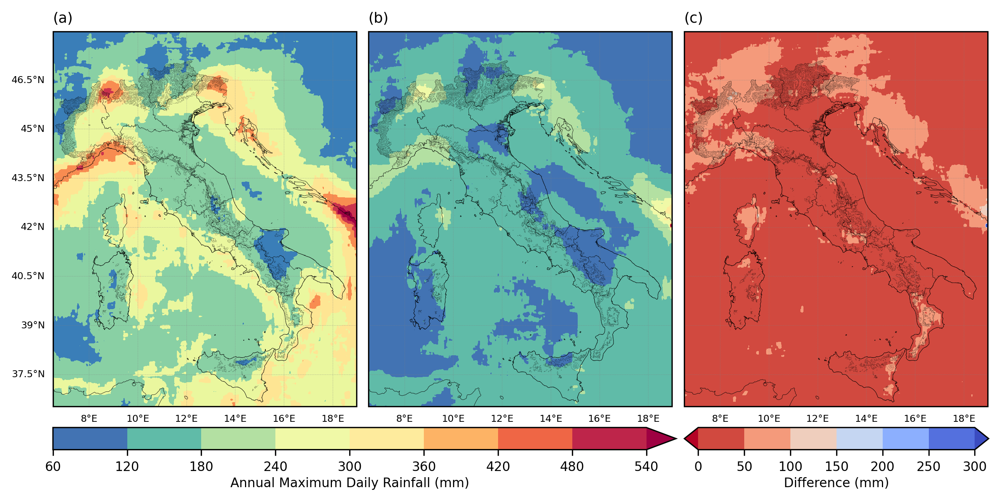

In [11]:
# Mev_levels = np.arange(30, 305, 5)
# Diff_levels = np.arange(-80, 85, 5)

Mev_levels = None
Mev_ticks = None
Diff_levels = None

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,3)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.2,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =True

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

a1 = ax1.contourf(lon2d, lat2d, Mev_s[3,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')#

ax1.set_title(f'(a)', fontsize=9, loc='left')
# ax1.set_title(f'Tr: 50 yrs', fontsize=8, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.2,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

a1 = ax1.contourf(lon2d, lat2d, Mev_d[3,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')#, extend='max'

ax1.set_title(f'(b)', fontsize=9, loc='left')
# ax1.set_title(f'ERA 5', fontsize=7, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2], projection = proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.2,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

a2 = ax1.contourf(lon2d, lat2d, Mev_d[3,:,:]-Mev_s[3,:,:], cmap=Mev_diff, levels=Diff_levels, extend='both')

ax1.set_title(f'(c)', fontsize=9, loc='left')
# ax1.set_title(f'ERA 5', fontsize=7, loc='right')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.04, hspace=0.01)

cbar_ax = fig.add_axes([0.05, 0, 0.6, 0.048])#0.96
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal', ticks=Mev_ticks)
cbar.ax.tick_params(labelsize=8)
cbar.ax.set_xlabel("Annual Maximum Daily Rainfall (mm)", fontsize=8, labelpad=2)

cbar_ax2 = fig.add_axes([0.658, 0, 0.293, 0.048])#0.96
cbar2 = fig.colorbar(a2, cax=cbar_ax2, orientation='horizontal', ticks=None)
cbar2.ax.tick_params(labelsize=8)
cbar2.ax.set_xlabel("Difference (mm)", fontsize=8, labelpad=2)

# ============================================================================================================================
ax1.set_facecolor('white')
fig.patch.set_alpha(0)

salida = os.path.join('..','figures','Article_down','figure4.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Scatter plot of Extreme Quantiles Tr=50yrs

In [12]:
val_remove = 500

In [13]:
def slope_intercept(data1,data2):
    mask = ~np.isnan(data1) & ~np.isnan(data2)
    x = data1[mask]
    y = data2[mask]
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    x_vals = np.arange(0,550)
    y_vals = slope * x_vals + intercept
    return x_vals, y_vals, slope

In [14]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_Q50.csv')
OBS_Q50 = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_ensemble_Q50.csv')
SAT_Q50 = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_ensemble_Q50.csv')
DOWN_Q50 = pd.read_csv(dir_in)

In [15]:
OBS_Q50_flat = OBS_Q50.values.flatten()
SAT_Q50_flat = SAT_Q50.values.flatten()
DOWN_Q50_flat = DOWN_Q50.values.flatten()

## Relative Error

In [16]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lat.csv')
OBS_RE_LAT = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lon.csv')
OBS_RE_LON = pd.read_csv(dir_in)

In [17]:
OBS_Q50_flat_norm = (OBS_Q50_flat-np.nanmin(OBS_Q50_flat))/(np.nanmax(OBS_Q50_flat)-np.nanmin(OBS_Q50_flat))

In [18]:
levels = np.arange(40,520,40)
norm_OBS = mcolors.BoundaryNorm(boundaries=levels, ncolors=256)

In [19]:
levels = np.arange(40,520,20)
norm_OBS = mcolors.BoundaryNorm(boundaries=levels, ncolors=256)

In [20]:
OBS_Q50_intense = OBS_Q50[OBS_Q50>400].values.flatten()
OBS_RE_LAT_intense = OBS_RE_LAT[OBS_Q50>400].values.flatten()
OBS_RE_LON_intense = OBS_RE_LON[OBS_Q50>400].values.flatten()

mask = np.where(~np.isnan(OBS_Q50_intense))
OBS_Q50_intense_clear = OBS_Q50_intense[mask]
OBS_RE_LAT_intense_clear = OBS_RE_LAT_intense[mask]
OBS_RE_LON_intense_clear = OBS_RE_LON_intense[mask]

OBS_Q50_intense_clear_norm = (OBS_Q50_intense_clear-np.nanmin(OBS_Q50_intense_clear))/(np.nanmax(OBS_Q50_intense_clear)-np.nanmin(OBS_Q50_intense_clear))

print(f'Number of station Q50 > 400: {len(OBS_Q50_intense_clear)}')

Number of station Q50 > 400: 27


/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Text(1.0, 1.0, 'Return Time: 50 yrs')

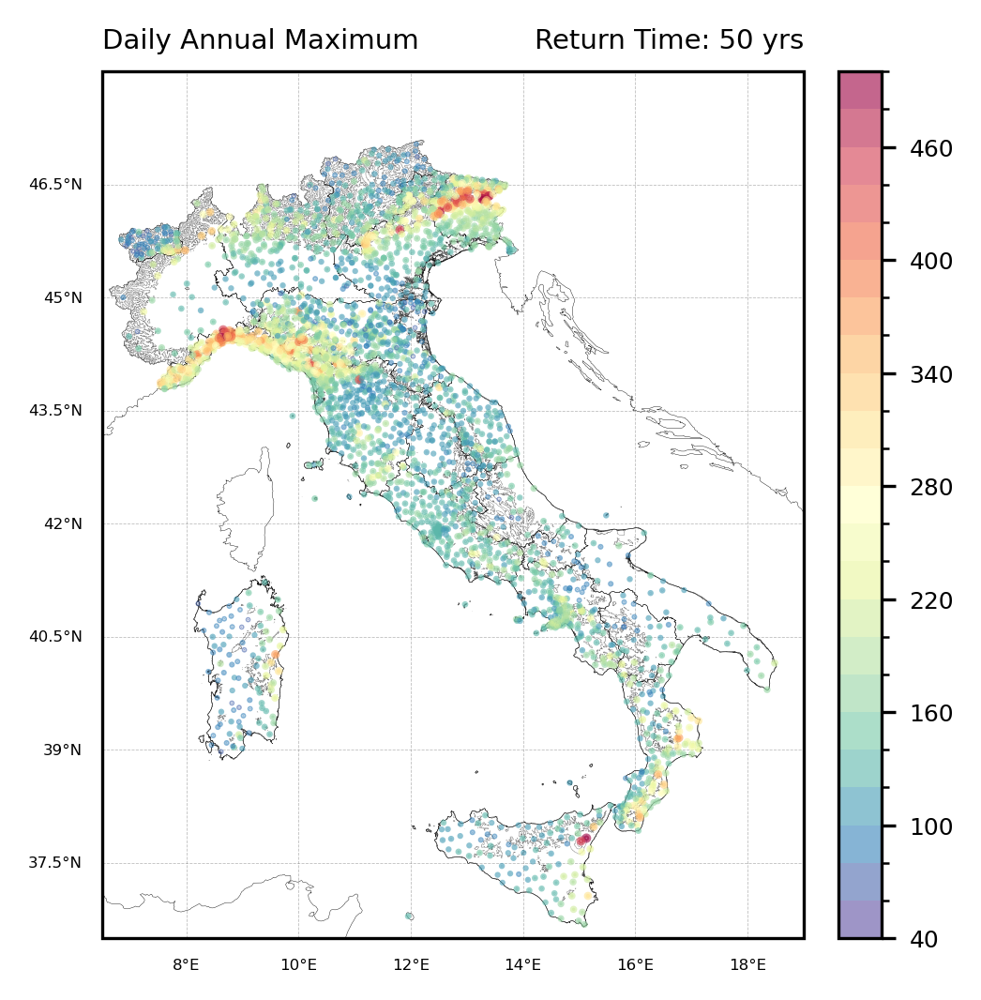

In [21]:
elev_cmap = plt.cm.Spectral_r
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(4,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

a1 = ax1.scatter(OBS_RE_LON.values.flatten(), OBS_RE_LAT.values.flatten(), 
                    c=OBS_Q50_flat, 
                    cmap=elev_cmap, 
                    s=OBS_Q50_flat_norm*2, 
                    alpha=0.6, 
                    norm=norm_OBS, 
                    zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('Daily Annual Maximum', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Text(1.0, 1.0, 'Return Time: 50 yrs')

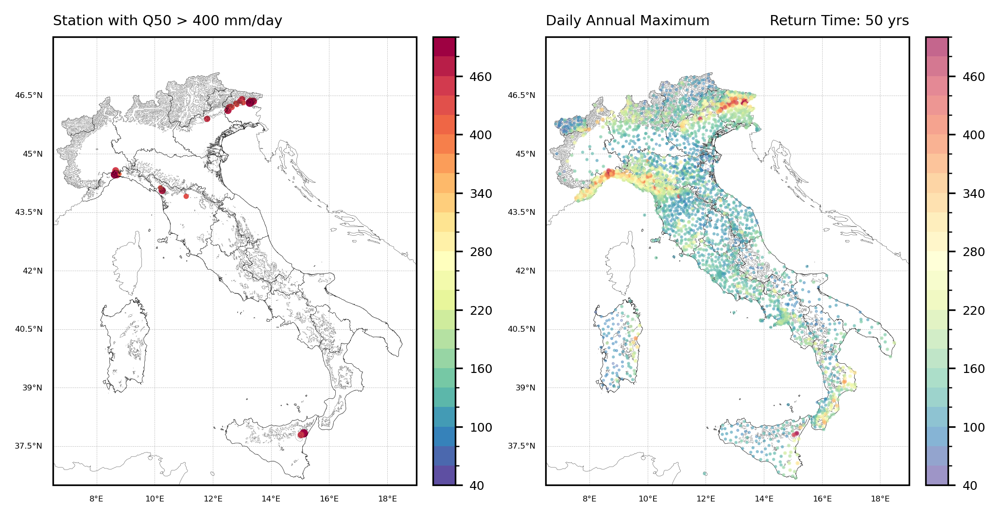

In [22]:
elev_cmap = plt.cm.Spectral_r
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(8,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

a1 = ax1.scatter(OBS_RE_LON_intense_clear,OBS_RE_LAT_intense_clear,s=OBS_Q50_intense_clear_norm*10, cmap=elev_cmap, c=OBS_Q50_intense_clear, norm=norm_OBS)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('Station with Q50 > 400 mm/day', fontsize=7, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

a1 = ax1.scatter(OBS_RE_LON.values.flatten(), OBS_RE_LAT.values.flatten(), 
                    c=OBS_Q50_flat, 
                    cmap=elev_cmap, 
                    s=OBS_Q50_flat_norm*2, 
                    alpha=0.6, 
                    norm=norm_OBS, 
                    zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('Daily Annual Maximum', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

In [23]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_ensemble_relative_error.csv')
SAT_RE = pd.read_csv(dir_in)

In [24]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_ensemble_relative_error.csv')
DOWN_RE = pd.read_csv(dir_in)

In [25]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_elev.csv')
OBS_ELEV = pd.read_csv(dir_in)

ELEV_ref = OBS_ELEV.values.flatten()
LON_ref = OBS_RE_LON.values.flatten()
LAT_ref = OBS_RE_LAT.values.flatten()

In [26]:
OBS_ELEV_clear = OBS_ELEV[(DOWN_RE>-1)&(DOWN_RE<1)]

OBS_Q50 = OBS_Q50[(DOWN_RE>-1)&(DOWN_RE<1)]
SAT_Q50 = SAT_Q50[(DOWN_RE>-1)&(DOWN_RE<1)]
DOWN_Q50 = DOWN_Q50[(DOWN_RE>-1)&(DOWN_RE<1)]

SAT_RE = SAT_RE[(DOWN_RE>-1)&(DOWN_RE<1)]
DOWN_RE = DOWN_RE[(DOWN_RE>-1)&(DOWN_RE<1)]

In [27]:
OBS_ELEV_clear = OBS_ELEV_clear[~np.isnan(OBS_Q50)]
SAT_RE = SAT_RE[~np.isnan(OBS_Q50)]
DOWN_RE = DOWN_RE[~np.isnan(OBS_Q50)]
OBS_RE_LAT = OBS_RE_LAT[~np.isnan(OBS_Q50)]
OBS_RE_LON = OBS_RE_LON[~np.isnan(OBS_Q50)]

In [28]:
OBS_ELEV_clear_flat = OBS_ELEV_clear.values.flatten()
SAT_RE_flat = SAT_RE.values.flatten()*100
DOWN_RE_flat = DOWN_RE.values.flatten()*100

In [29]:
OBS_ELEV_clear_flat_norm = (OBS_ELEV_clear_flat-np.nanmin(OBS_ELEV_clear_flat))/(np.nanmax(OBS_ELEV_clear_flat)-np.nanmin(OBS_ELEV_clear_flat))

In [30]:
sort_idx = np.argsort(OBS_ELEV_clear_flat)

OBS_Q50_sorted = OBS_Q50_flat[sort_idx]
DOWN_Q50_sorted = DOWN_Q50_flat[sort_idx]
elev_c_sorted = OBS_ELEV_clear_flat[sort_idx]
elev_s_sorted = OBS_ELEV_clear_flat_norm[sort_idx] * 35

DOWN_RE_sorted = DOWN_RE_flat[sort_idx]

### for all data

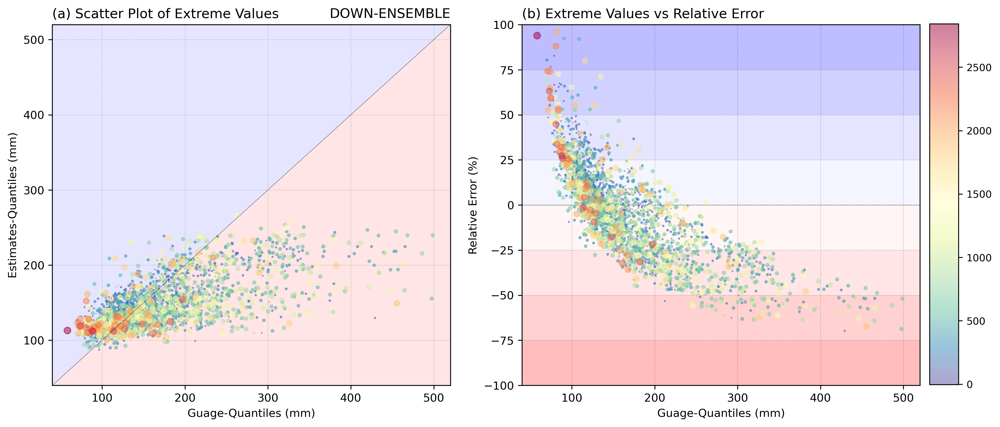

In [31]:
fig = plt.figure(figsize=(12,5),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')
ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

a1 = ax1.scatter(
    OBS_Q50_sorted, DOWN_Q50_sorted,
    alpha=0.5,
    s=elev_s_sorted,
    c=elev_c_sorted,
    cmap="Spectral_r"
)

# plt.colorbar(a1)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.1, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.1, zorder=0)

ax1.set_xlim(40,val_remove+20)
ax1.set_ylim(40,val_remove+20)
ax1.grid(linewidth=0.3, linestyle='--')

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=10)
ax1.set_title('(a) Scatter Plot of Extreme Values', loc='left', fontsize=12)
ax1.set_title('DOWN-ENSEMBLE', loc='right', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1])

ax1.axhline(y=0, color="black", linestyle="--", linewidth=0.3)
ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

a1 = ax1.scatter(
    OBS_Q50_sorted, DOWN_RE_sorted,
    alpha=0.5,
    s=elev_s_sorted,
    c=elev_c_sorted,
    cmap="Spectral_r",
    zorder=10
)

# plt.colorbar(a1)

ax1.axhspan(75, 100, facecolor="blue", alpha=0.26, label='Overestimation area', zorder=2)
ax1.axhspan(50, 75, facecolor="blue", alpha=0.18, label='Overestimation area', zorder=2)
ax1.axhspan(25, 50, facecolor="blue", alpha=0.1, label='Overestimation area', zorder=2)
ax1.axhspan(0, 25, facecolor="blue", alpha=0.04, label='Overestimation area', zorder=2)

ax1.axhspan(-25, 0, facecolor="red", alpha=0.04, label='Underestimation area', zorder=2)
ax1.axhspan(-50, -25, facecolor="red", alpha=0.1, label='Underestimation area', zorder=2)
ax1.axhspan(-75, -50, facecolor="red", alpha=0.18, label='Underestimation area', zorder=2)
ax1.axhspan(-100, -75, facecolor="red", alpha=0.26, label='Underestimation area', zorder=2)

ax1.set_xlim(40,val_remove+20)
ax1.set_ylim(-100,100)
ax1.grid(linewidth=0.3, linestyle='--')

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)
ax1.set_ylabel('Relative Error (%)',fontsize=10) 
ax1.set_title('(b) Extreme Values vs Relative Error', loc='left', fontsize=12)

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.18, hspace=0.1)

cbar_ax = fig.add_axes([0.96, 0.052, 0.03, 0.9])#0.96
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=9)


(-10.0, 550.0)

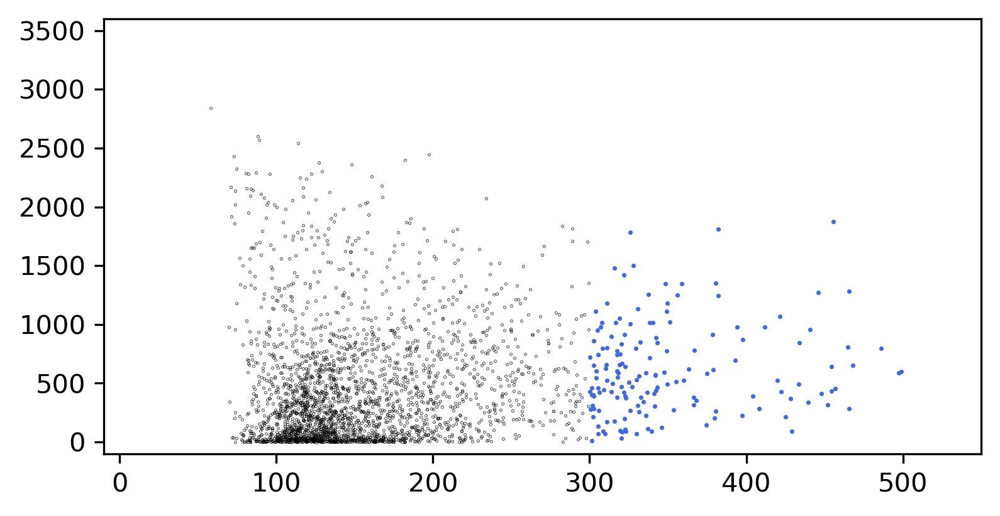

In [32]:
fig = plt.figure(figsize=(6,3),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(OBS_Q50_sorted,elev_c_sorted,s=0.1,c='k',marker='.')
ax1.scatter(OBS_Q50_sorted[OBS_Q50_sorted>300],elev_c_sorted[OBS_Q50_sorted>300],s=2,c='royalblue',marker='.')

ax1.set_ylim(-100,3600)
ax1.set_xlim(-10, 550)

In [33]:
elev_filter = elev_c_sorted[OBS_Q50_sorted>300]

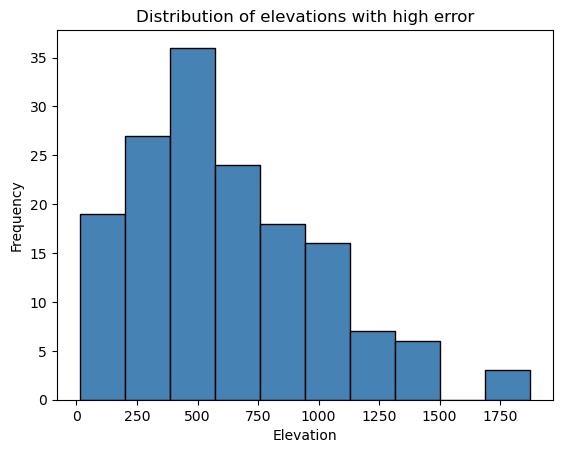

In [34]:
plt.hist(elev_filter, bins=10, color='steelblue', edgecolor='black')
plt.xlabel("Elevation")
plt.ylabel("Frequency")
plt.title("Distribution of elevations with high error")
plt.show()

### Lower for a specific elevation

In [35]:
# SAT_RE_flat = SAT_RE_flat[OBS_Q50_flat<val_remove]
# DOWN_RE_flat = DOWN_RE_flat[OBS_Q50_flat<val_remove]

# SAT_Q50_flat = SAT_Q50_flat[OBS_Q50_flat<val_remove]
# DOWN_Q50_flat = DOWN_Q50_flat[OBS_Q50_flat<val_remove]
# OBS_Q50_flat = OBS_Q50_flat[OBS_Q50_flat<val_remove]

In [36]:
OBS_SAT_x, OBS_SAT_y, OBS_SAT_slope = slope_intercept(OBS_Q50_flat, SAT_Q50_flat)
OBS_DOWN_x, OBS_DOWN_y, OBS_DOWN_slope = slope_intercept(OBS_Q50_flat, DOWN_Q50_flat)

Export figure to: ../figures/Article_down/figure5.png


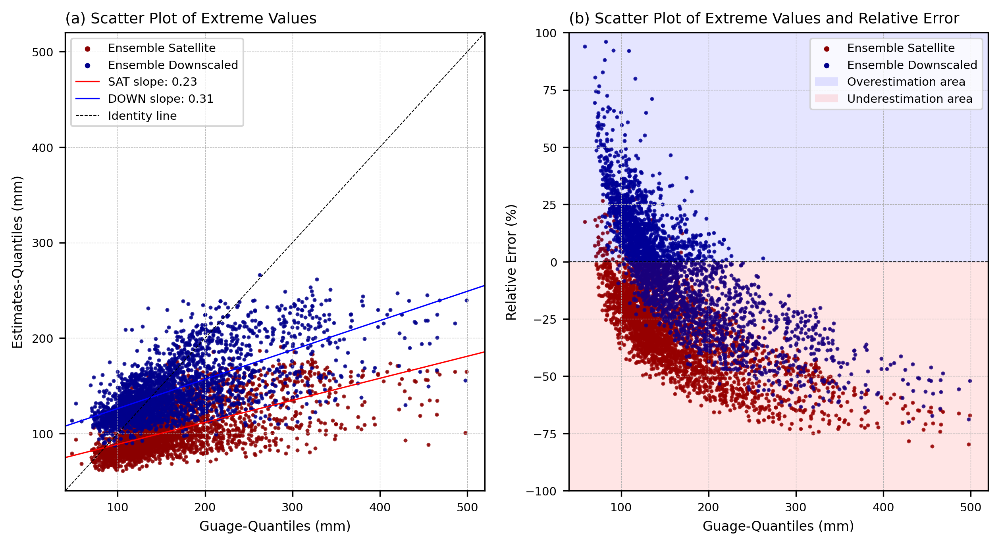

In [37]:
fig = plt.figure(figsize=(10,5),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.scatter(OBS_Q50_flat,SAT_Q50_flat, alpha=0.8, s=2, c='darkred')
ax1.scatter(OBS_Q50_flat,DOWN_Q50_flat, alpha=0.8, s=2, c='darkblue')

ax1.plot(OBS_SAT_x, OBS_SAT_y, color="r", linewidth=0.8, label=f"SAT slope: {np.round(OBS_SAT_slope,2)}")
ax1.plot(OBS_DOWN_x, OBS_DOWN_y, color="b", linewidth=0.8, label=f"DOWN slope: {np.round(OBS_DOWN_slope,2)}")

ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.5, label='Identity line')

ax1.set_xlim(40,val_remove+20)
ax1.set_ylim(40,val_remove+20)

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=2, ncol=1)

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=8)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=8)
ax1.set_title('(a) Scatter Plot of Extreme Values', loc='left', fontsize=9)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1])

ax1.scatter(OBS_Q50_flat,SAT_RE_flat, alpha=0.8, s=2, c='darkred')
ax1.scatter(OBS_Q50_flat,DOWN_RE_flat, alpha=0.8, s=2, c='darkblue')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.axhline(y=0, color="black", linestyle="--", linewidth=0.5)

ax1.axhspan(0, 100, facecolor="blue", alpha=0.1, label='Overestimation area')
ax1.axhspan(-100, 0, facecolor="red", alpha=0.1, label='Underestimation area')

ax1.set_xlim(40,val_remove+20)
ax1.set_ylim(-100,100)

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=0, ncol=1)

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=8)
ax1.set_ylabel('Relative Error (%)',fontsize=8) 
ax1.set_title('(b) Scatter Plot of Extreme Values and Relative Error', loc='left', fontsize=9)

# ============================================================================================================================
salida = os.path.join('..','figures','Article_down','figure5.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Elevation Analysis

Text(0, 0.5, 'Estimates-Quantiles (mm)')

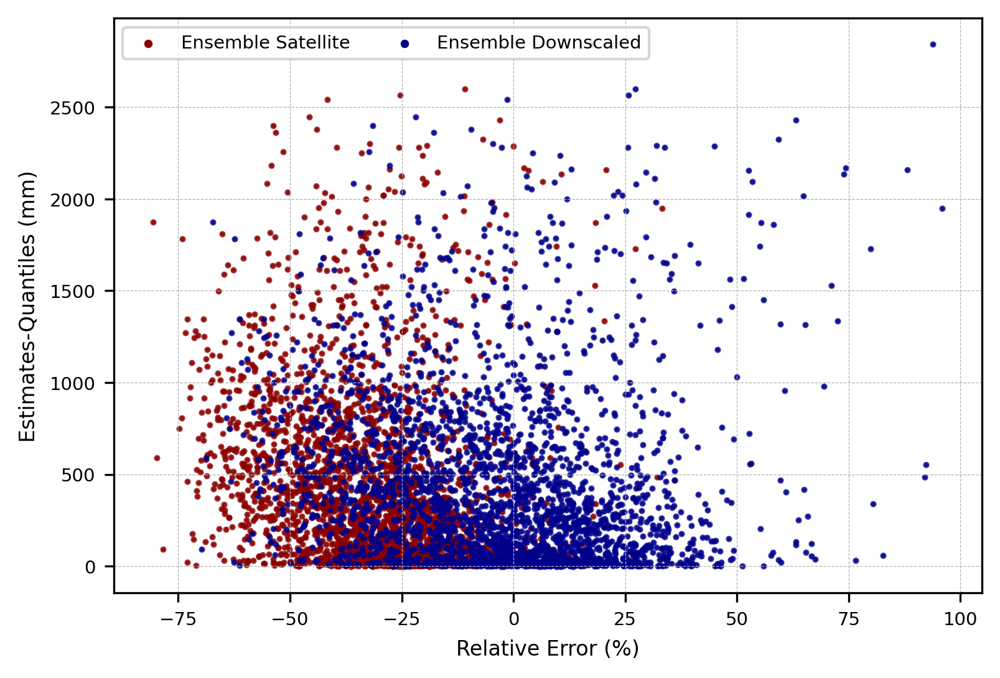

In [38]:
fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(SAT_RE_flat,ELEV_ref, alpha=0.8, s=2, c='darkred')
ax1.scatter(DOWN_RE_flat,ELEV_ref, alpha=0.8, s=2, c='darkblue')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

# ax1.axhspan(0, 100, facecolor="blue", alpha=0.1, label='Overestimation area')
# ax1.axhspan(-100, 0, facecolor="red", alpha=0.1, label='Underestimation area')

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=2, ncol=2)
# ax1.set_xlim(-100,100)

ax1.set_xlabel('Relative Error (%)',fontsize=8) 
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=8)

In [39]:
# elev_min, elev_max = 100, 1000
# elev_min, elev_max = 500, 1000
elev_min, elev_max = 0, 30
# elev_min, elev_max = 2400, 2500

elev_pos = np.where((ELEV_ref>=elev_min)&(ELEV_ref<elev_max))

In [40]:
pos_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]>0])/len(DOWN_RE_flat[elev_pos]))*100
neg_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]<0])/len(DOWN_RE_flat[elev_pos]))*100

Text(0.0, 1.0, 'Elevation interval: 0m to 30m')

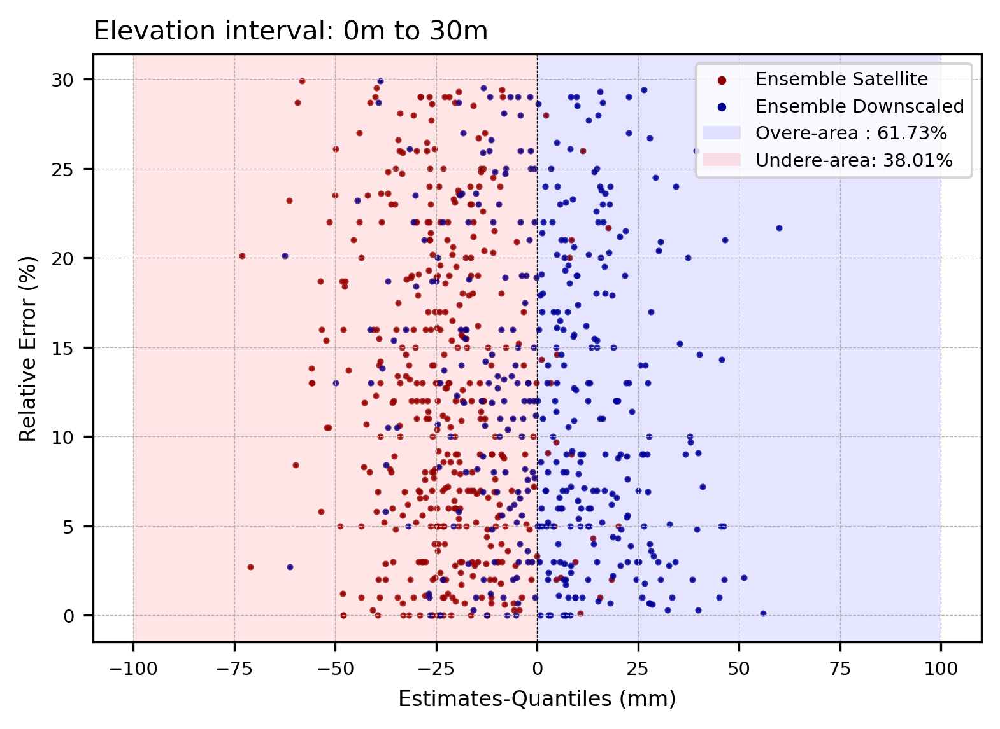

In [41]:
fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.axvline(x=0, color="k", linestyle="--", linewidth=0.3)
ax1.scatter(SAT_RE_flat[elev_pos],ELEV_ref[elev_pos], alpha=0.8, s=2, c='darkred')
ax1.scatter(DOWN_RE_flat[elev_pos],ELEV_ref[elev_pos], alpha=0.8, s=2, c='darkblue')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.axvspan(0, 100, facecolor="blue", alpha=0.1, label=f'Overe-area : {np.round(pos_frac,2)}%')
ax1.axvspan(-100, 0, facecolor="red", alpha=0.1, label=f'Undere-area: {np.round(neg_frac,2)}%')

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=0, ncol=1)
# ax1.set_xlim(-100,100)

ax1.set_ylabel('Relative Error (%)',fontsize=8) 
ax1.set_xlabel('Estimates-Quantiles (mm)',fontsize=8)

ax1.set_title(f'Elevation interval: {elev_min}m to {elev_max}m', loc='left', fontsize=10)

# ============================================================================================================================


## Proportion for diferentes Elevation levels

In [42]:
elev_min_list = [0, 10, 50, 100, 200, 500, 800, 1200, 1600, 2000]
elev_max_list = [10, 50, 100, 200, 500, 800, 1200, 1600, 2000, 2500]
for nn in range(len(elev_max_list)):
    elev_pos = np.where((ELEV_ref>=elev_min_list[nn])&(ELEV_ref<elev_max_list[nn]))
    pos_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]>0])/len(DOWN_RE_flat[elev_pos]))*100
    neg_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]<0])/len(DOWN_RE_flat[elev_pos]))*100
    

In [43]:
inc = 100

# elev_min_list = [0, 10, 50, 100, 200, 500, 800, 1200, 1600, 2000]
# elev_max_list = [10, 50, 100, 200, 500, 800, 1200, 1600, 2000, 2500]
elev_min_list = np.arange(0,2500,inc)
elev_max_list = np.arange(inc,2500+inc,inc)

pos_fracs = []
neg_fracs = []
total_est = []
labels = []

for nn in range(len(elev_max_list)):
    elev_pos = np.where((ELEV_ref >= elev_min_list[nn]) & (ELEV_ref < elev_max_list[nn]))
    pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
    neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100
    
    total_est.append(len(DOWN_RE_flat[elev_pos]))
    pos_fracs.append(pos_frac)
    neg_fracs.append(neg_frac)
    labels.append(f"{elev_min_list[nn]}-{elev_max_list[nn]}")
    
    if nn == len(elev_max_list)-1:
        elev_pos = np.where((ELEV_ref >= elev_min_list[nn]) & (ELEV_ref < elev_max_list[nn]))
        pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
        neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100

        total_est.append(len(DOWN_RE_flat[elev_pos]))
        pos_fracs.append(pos_frac)
        neg_fracs.append(neg_frac)
        labels.append(f"{elev_min_list[nn]}-{elev_max_list[nn]}")

        elev_pos = np.where(ELEV_ref >= elev_max_list[nn])
        pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
        neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100

        total_est.append(len(DOWN_RE_flat[elev_pos]))
        pos_fracs.append(pos_frac)
        neg_fracs.append(neg_frac)
        labels.append(f"2500")

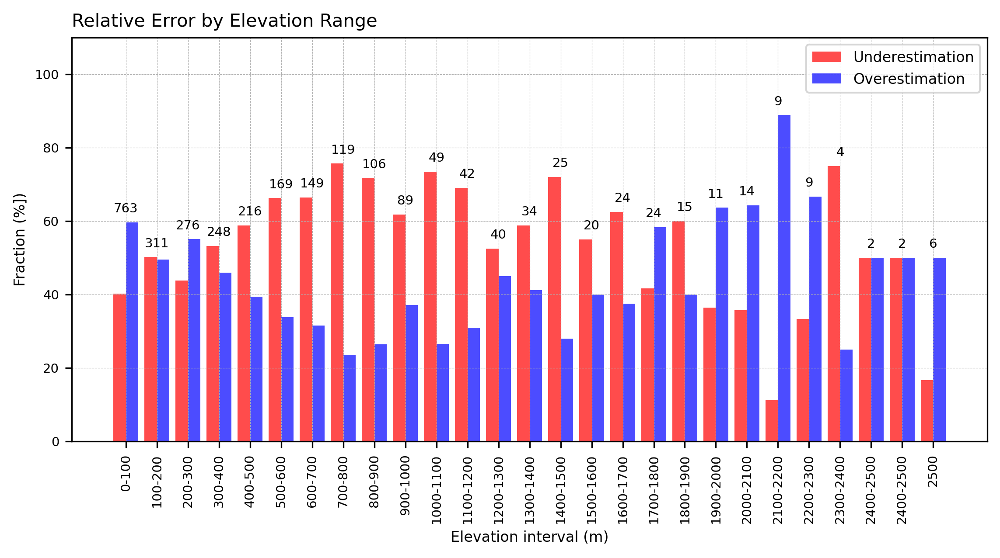

In [44]:
x = np.arange(len(labels))
width = 0.8

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
bars1 = ax1.bar(2*x - width/2, neg_fracs, width, color="red", alpha=0.7, label="Underestimation")
bars2 = ax1.bar(2*x + width/2, pos_fracs, width, color="blue", alpha=0.7, label="Overestimation")

for i, val in enumerate(total_est):
    xpos = 2*(x[i])                       # centro del grupo (entre las dos barras)
    ypos = max(neg_fracs[i], pos_fracs[i]) + 2  # un poco arriba de la barra más alta
    ax1.text(
        xpos, ypos, str(val),
        ha="center", va="bottom",
        fontsize=7, color="black"
    )

ax1.set_xticks(2*np.arange(len(labels)))
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_xticklabels(labels, rotation=90, fontsize=7)
ax1.set_ylabel("Fraction (%])",fontsize=8)
ax1.set_xlabel("Elevation interval (m)",fontsize=8)
ax1.set_title("Relative Error by Elevation Range", loc='left',fontsize=10)
ax1.legend(fontsize=8)

ax1.set_ylim(0,110)
ax1.grid(linewidth=0.3, linestyle='--')

## Boxplot in relation to Elevation

In [45]:
levels_filter = [10, 50, 100, 500, 1000, 1500, 2000]
# levels_filter_labels = (['<10','>=10 & <50','>=50 & <100','>=100 & <500','>=500 & <1000','>=1000 & <1500','>=2000'])
levels_filter_labels = [r"$< 10$", r"$10 \leq x < 50$",r"$50 \leq x < 100$",r"$100 \leq x < 500$",r"$500 \leq x < 1000$",r"$1000 \leq x < 1500$",r"$1500 \leq x < 200$",r"$\geq 2000$"]

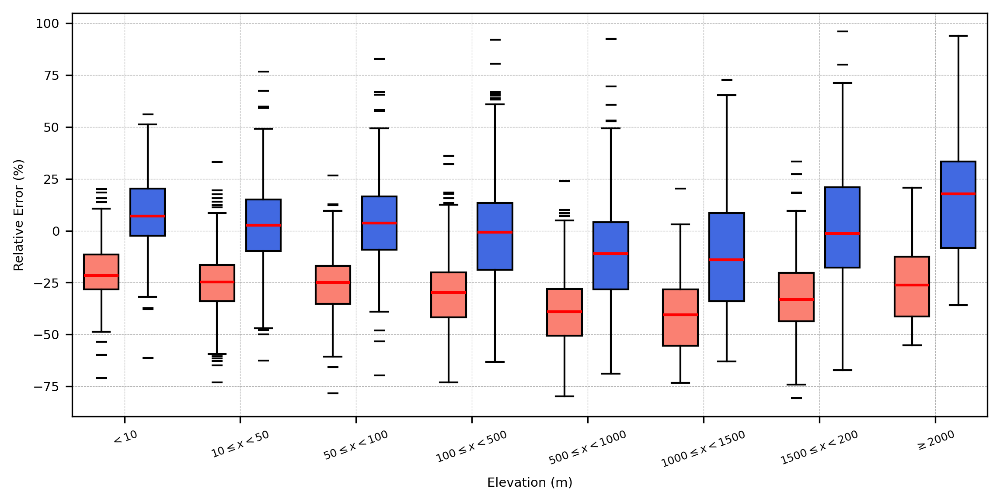

In [46]:
box_width = 0.6

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []

for ll in np.arange(len(levels_filter)):
    if ll == 0:
        SAT_elev_tmp = SAT_RE[OBS_ELEV<levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*ll],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

        DOWN_elev_tmp = DOWN_RE[OBS_ELEV<levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*ll+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

    elif ll == len(levels_filter)-1:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*ll],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*ll+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)
        
        SAT_elev_tmp = SAT_RE[OBS_ELEV>=levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*(ll+1)],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)
        
        DOWN_elev_tmp = DOWN_RE[OBS_ELEV>=levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*(ll+1)+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

    else:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*ll],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*ll+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

ax1.grid(linewidth=0.3, linestyle='--')

ax1.set_xticks(np.arange(0.4,(len(levels_filter)+1)*2,2))
ax1.set_xticklabels(levels_filter_labels)

ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Elevation (m)', fontsize=7)
# ax1.set_ylim(-100,100)
ax1.tick_params(axis='x', which='major', labelsize=6, rotation=20) 


## Violin plot

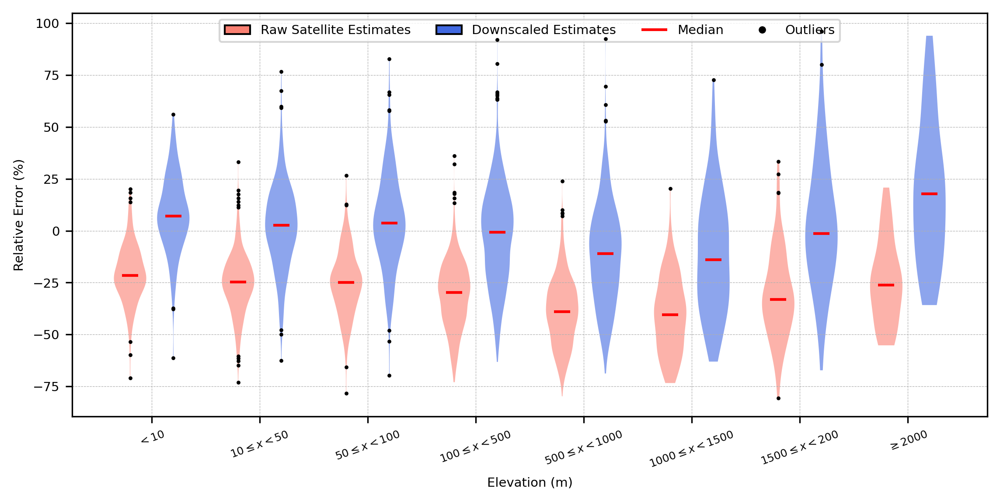

In [47]:
SAT_color = "salmon"
DOWN_color = "royalblue"
SAT_bodies = []
DOWN_bodies = []

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []

for ll in np.arange(len(levels_filter)):
    if ll == 0:
        SAT_elev_tmp = SAT_RE[OBS_ELEV<levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*ll], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll, len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[OBS_ELEV<levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*ll+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")
    
    elif ll == len(levels_filter)-1:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*ll], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll, len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*ll+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        SAT_elev_tmp = SAT_RE[OBS_ELEV>=levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*(ll+1)], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*(ll+1), len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[OBS_ELEV>=levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*(ll+1)+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*(ll+1)+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

    else:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*ll], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll, len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*ll+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        SAT_boxes.append(SAT_box["boxes"][0])
        DOWN_boxes.append(DOWN_box["boxes"][0])
        medians.append(SAT_box["medians"][0])

out = ax1.plot([],[],'.',c='k',label='Outliers')[0]

ax1.grid(linewidth=0.3, linestyle='--')

ax1.set_xticks(np.arange(0.4,(len(levels_filter)+1)*2,2))
ax1.set_xticklabels(levels_filter_labels)

ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Elevation (m)', fontsize=7)
# ax1.set_ylim(-100,100)

ax1.legend(
    [SAT_boxes[0], DOWN_boxes[0], medians[0], out],
    ['Raw Satellite Estimates', 'Downscaled Estimates', 'Median', 'Outliers'], 
    ncol=4, fontsize=7, loc='upper center'
)
ax1.tick_params(axis='x', which='major', labelsize=6, rotation=20)

## Geographical position and Evelevation

In [48]:
LAT_ref = LAT_ref[~np.isnan(ELEV_ref)]
LON_ref = LON_ref[~np.isnan(ELEV_ref)]
ELEV_ref = ELEV_ref[~np.isnan(ELEV_ref)]

ELEV_ref_norm = (ELEV_ref-ELEV_ref.min())/(ELEV_ref.max()-ELEV_ref.min())

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Text(1.0, 1.0, 'Return Time: 50 yrs')

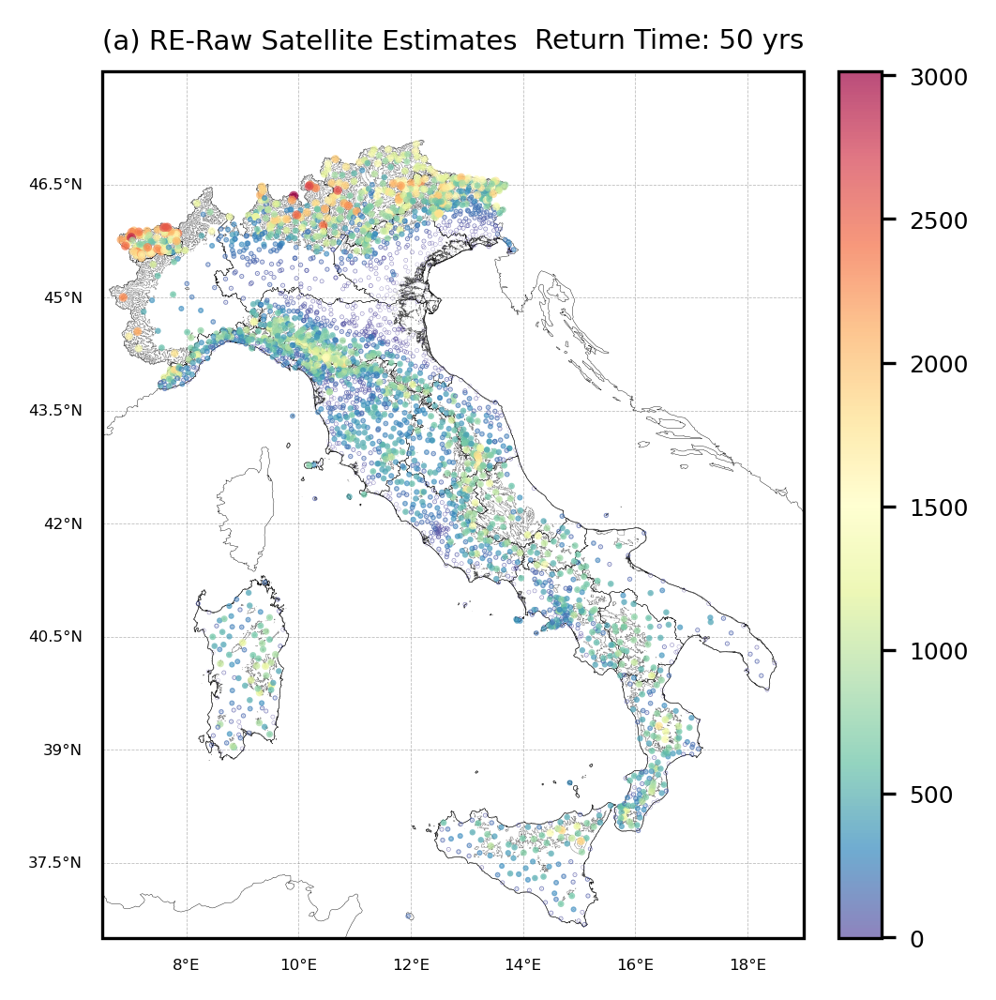

In [49]:
elev_cmap = plt.cm.Spectral_r
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(4,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

a1 = ax1.scatter(LON_ref, LAT_ref, c=ELEV_ref, cmap=elev_cmap, s=ELEV_ref_norm*2, alpha=0.7, norm=None, zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) RE-Raw Satellite Estimates', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

## Relative Errors distribution

In [50]:
SAT_subes = SAT_RE_flat[SAT_RE_flat<0]
SAT_super = SAT_RE_flat[SAT_RE_flat>0]
print(f'Total of values         : {len(SAT_RE_flat[~np.isnan(SAT_RE_flat)])}')
print(f'# Subestimation values  : {len(SAT_RE_flat[SAT_RE_flat<0])/len(SAT_RE_flat[~np.isnan(SAT_RE_flat)])*100}')
print(f'# Underestimation values: {len(SAT_RE_flat[SAT_RE_flat>0])/len(SAT_RE_flat[~np.isnan(SAT_RE_flat)])*100}')

Total of values         : 2782
# Subestimation values  : 96.80086268871315
# Underestimation values: 3.199137311286844


In [51]:
DOWN_subes = DOWN_RE_flat[DOWN_RE_flat<0]
DOWN_super = DOWN_RE_flat[DOWN_RE_flat>0]
print(f'Total of values       : {len(DOWN_RE_flat[~np.isnan(DOWN_RE_flat)])}')
print(f'# Subestimation values: {len(DOWN_RE_flat[DOWN_RE_flat<0])/len(DOWN_RE_flat[~np.isnan(DOWN_RE_flat)])*100}')
print(f'# Underestimation values: {len(DOWN_RE_flat[DOWN_RE_flat>0])/len(DOWN_RE_flat[~np.isnan(DOWN_RE_flat)])*100}')

Total of values       : 2782
# Subestimation values: 52.83968368080517
# Underestimation values: 47.16031631919482


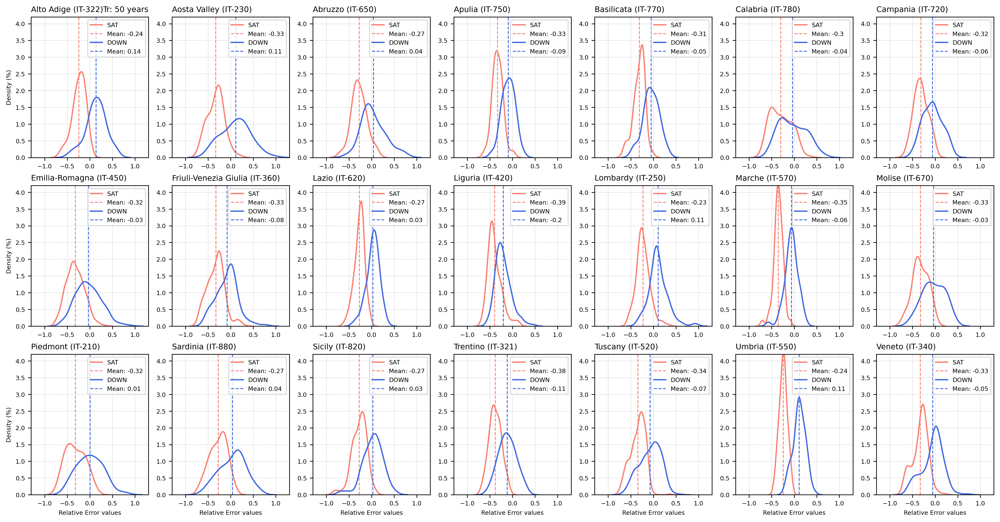

In [52]:
dict_keys = ISO_names['ISO'].values

fig = plt.figure(figsize=(20,10),dpi=300)
gs = gridspec.GridSpec(3,7)

pos = 0
for nrow in range(3):
    for ncol in range(7):
        ax1 = plt.subplot(gs[nrow, ncol])

        SAT_RE_mean = np.round(np.nanmean(SAT_RE[dict_keys[pos]]),2)
        sns.kdeplot(SAT_RE[dict_keys[pos]],color='salmon',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'SAT')
        ax1.axvline(np.nanmean(SAT_RE[dict_keys[pos]]),color='salmon',linestyle='--',linewidth=1, label=f'Mean: {SAT_RE_mean}')

        DOWN_RE_mean = np.round(np.nanmean(DOWN_RE[dict_keys[pos]]),2)
        sns.kdeplot(DOWN_RE[dict_keys[pos]],color='royalblue',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'DOWN')
        ax1.axvline(np.nanmean(DOWN_RE[dict_keys[pos]]),color='royalblue',linestyle='--',linewidth=1, label=f'Mean: {DOWN_RE_mean}')

        ax1.set_xlim(-1.3,1.3)
        ax1.set_ylim(0,4.2)
        ax1.legend(fontsize=7, loc=1, ncol=1)
        ax1.grid(linewidth=0.3, linestyle='--')
        ax1.tick_params(axis='both', which='major', labelsize=7)

        if ncol == 0:
            ax1.set_ylabel('')
            ax1.set_ylabel('Density (%)',fontsize=7)
            if nrow == 0:
                ax1.set_title(f'Tr: 50 years', fontsize=9, loc='right')
        else:
            ax1.set_ylabel('')

        if nrow == 2:
            ax1.set_xlabel('Relative Error values',fontsize=7) 
        else:
            ax1.set_xlabel('')

        region_l = ISO_names[ISO_names['ISO']==dict_keys[pos]].values[0][0]
        ISO_l = ISO_names[ISO_names['ISO']==dict_keys[pos]].values[0][1]
        ax1.set_title(f'{region_l} ({ISO_l})', fontsize=9, loc='left')

        pos += 1

## Boxplot

Text(1.0, 1.0, 'Return Time: 50 yrs')

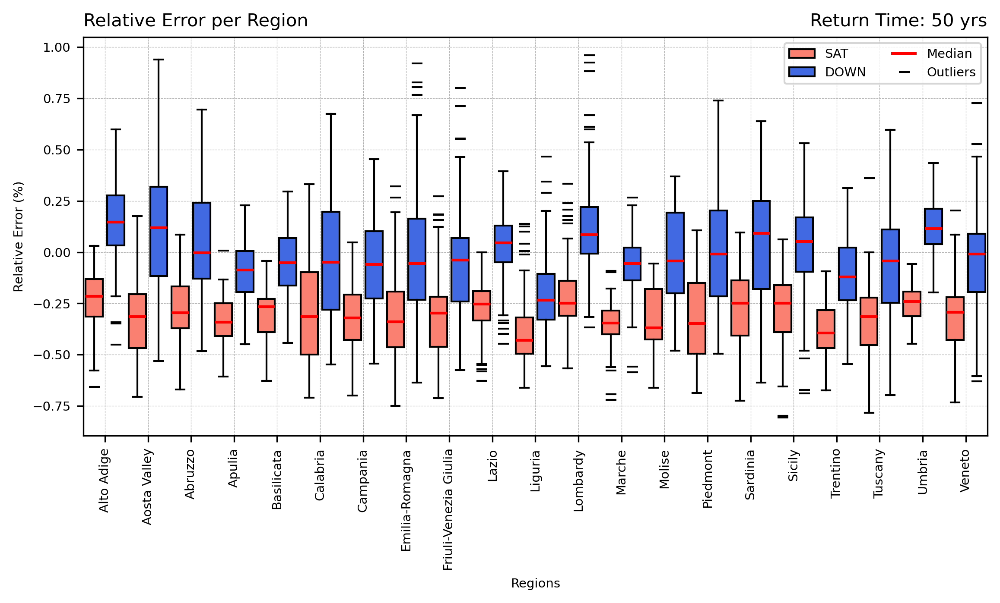

In [53]:
box_width = 0.8
x_pos = np.arange(0.5,42,2)

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []
for pos in range(len(dict_keys)):

    SAT_tmp = SAT_RE[dict_keys[pos]]
    SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
    SAT_box = ax1.boxplot(SAT_tmp,positions=[2*pos],
    widths=box_width,boxprops=SAT_boxprops,
    showmeans=False,meanline=True,meanprops=meanprops,
    medianprops=medianprops,
    showfliers=True,flierprops=flierprops,
    patch_artist=True,notch=False)

    DOWN_tmp = DOWN_RE[dict_keys[pos]]
    DOWN_tmp = DOWN_tmp[~np.isnan(DOWN_tmp)]
    DOWN_box = ax1.boxplot(DOWN_tmp,positions=[2*pos+1],
    widths=box_width,boxprops=DOWN_boxprops,
    showmeans=False,meanline=True,meanprops=meanprops,
    medianprops=medianprops,
    showfliers=True,flierprops=flierprops,
    patch_artist=True,notch=False)

    SAT_boxes.append(SAT_box["boxes"][0])
    DOWN_boxes.append(DOWN_box["boxes"][0])
    medians.append(SAT_box["medians"][0])
    fliers.append(SAT_box["fliers"][0])

ax1.plot([],[],linestyle='-',c='r',label='Median')
ax1.plot([],[],linestyle='-',c='k',label='Outliers')

ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_xticks(x_pos)
ax1.set_xticklabels(ISO_names['Region'].values, rotation='vertical')

ax1.grid(linewidth=0.3, linestyle='--')

ax1.legend([SAT_boxes[0], DOWN_boxes[0], medians[0], fliers[0]],
        ['SAT', 'DOWN', 'Median', 'Outliers'], 
        ncol=2,fontsize=7,loc=1)

ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Regions', fontsize=7)

ax1.set_title('Relative Error per Region', fontsize=10, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=10, loc='right')

Export figure to: ../figures/Article_down/figure6.png


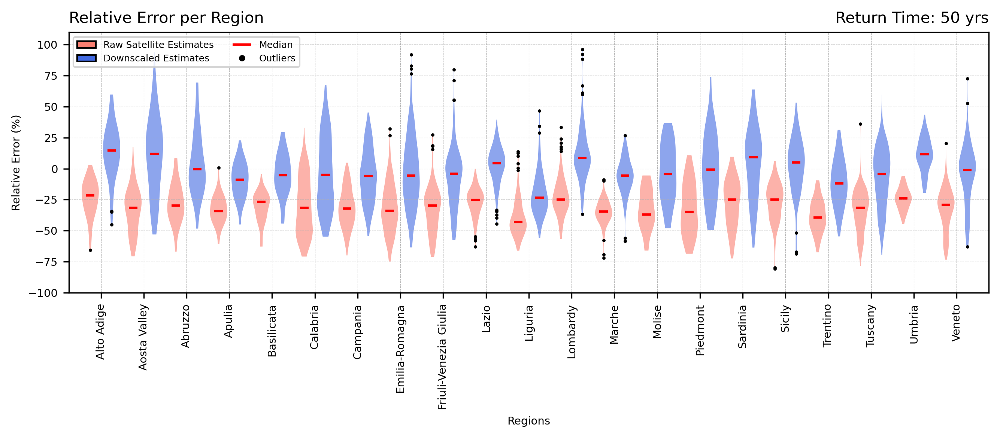

In [54]:
box_width = 0.8
x_pos = np.arange(0.5, 42, 2)

fig = plt.figure(figsize=(9,4), dpi=300)
gs = gridspec.GridSpec(1,1)

ax1 = plt.subplot(gs[0, 0])

# Colores personalizados
SAT_color = "salmon"
DOWN_color = "royalblue"

SAT_bodies = []
DOWN_bodies = []

for pos in range(len(dict_keys)):
    # ====================================================================================
    # SAT
    SAT_tmp = SAT_RE[dict_keys[pos]]
    SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]*100

    SAT_vio = ax1.violinplot(SAT_tmp, positions=[2*pos], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
    for b in SAT_vio['bodies']:
        b.set_facecolor(SAT_color)
        b.set_alpha(0.6)
    SAT_vio['cmedians'].set_color("r")
    SAT_bodies.append(SAT_vio['bodies'][0])
    
    Q1 = np.percentile(SAT_tmp, 25)
    Q3 = np.percentile(SAT_tmp, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_SAT = SAT_tmp[(SAT_tmp < lower_bound) | (SAT_tmp > upper_bound)]
    ax1.scatter(np.repeat(2*pos, len(outliers_SAT)), outliers_SAT,
                color="k", marker=".", s=5, zorder=20, label="Outliers" if pos==0 else "")

    # ====================================================================================
    # DOWN
    DOWN_tmp = DOWN_RE[dict_keys[pos]]
    DOWN_tmp = DOWN_tmp[~np.isnan(DOWN_tmp)]*100

    DOWN_vio = ax1.violinplot(DOWN_tmp, positions=[2*pos+1], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
    for b in DOWN_vio['bodies']:
        b.set_facecolor(DOWN_color)
        b.set_alpha(0.6)
    DOWN_vio['cmedians'].set_color("r")
    DOWN_bodies.append(DOWN_vio['bodies'][0])
    
    Q1 = np.percentile(DOWN_tmp, 25)
    Q3 = np.percentile(DOWN_tmp, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_DOWN = DOWN_tmp[(DOWN_tmp < lower_bound) | (DOWN_tmp > upper_bound)]
    ax1.scatter(np.repeat(2*pos+1, len(outliers_DOWN)), outliers_DOWN,
                color="k", marker=".", s=5, zorder=20, label="Outliers" if pos==0 else "")

out = ax1.plot([],[],'.',c='k',label='Outliers')[0]

# Ejes y leyenda
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_xticks(x_pos)
ax1.set_xticklabels(ISO_names['Region'].values, rotation='vertical')
ax1.set_xlim(-1,42)
ax1.set_ylim(-100,110)

ax1.grid(linewidth=0.3, linestyle='--')

ax1.legend(
    [SAT_boxes[0], DOWN_boxes[0], medians[0], out],
    ['Raw Satellite Estimates', 'Downscaled Estimates', 'Median', 'Outliers'], 
    ncol=2, fontsize=6, loc=2
)

ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Regions', fontsize=7)

ax1.set_title('Relative Error per Region', fontsize=10, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=10, loc='right')

plt.tight_layout()

salida = os.path.join('..','figures','Article_down','figure6.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


## Mean Relative Error

In [55]:
SAT_mean = []
SAT_median = []
DOWN_mean = []
DOWN_median = []
for pos in range(len(ISO_names)):
    SAT_mean.append(float(np.nanmean(SAT_RE[ISO_names['ISO'].values[pos]])))
    SAT_median.append(float(np.nanmedian(SAT_RE[ISO_names['ISO'].values[pos]])))
    DOWN_mean.append(float(np.nanmean(DOWN_RE[ISO_names['ISO'].values[pos]])))
    DOWN_median.append(float(np.nanmedian(DOWN_RE[ISO_names['ISO'].values[pos]])))

ISO_names['SAT_RE_mean'] = SAT_mean
ISO_names['DOWN_RE_mean'] = DOWN_mean
ISO_names['SAT_RE_median'] = SAT_median
ISO_names['DOWN_RE_median'] = DOWN_median

Export figure to: ../figures/Article_down/mean_median.png


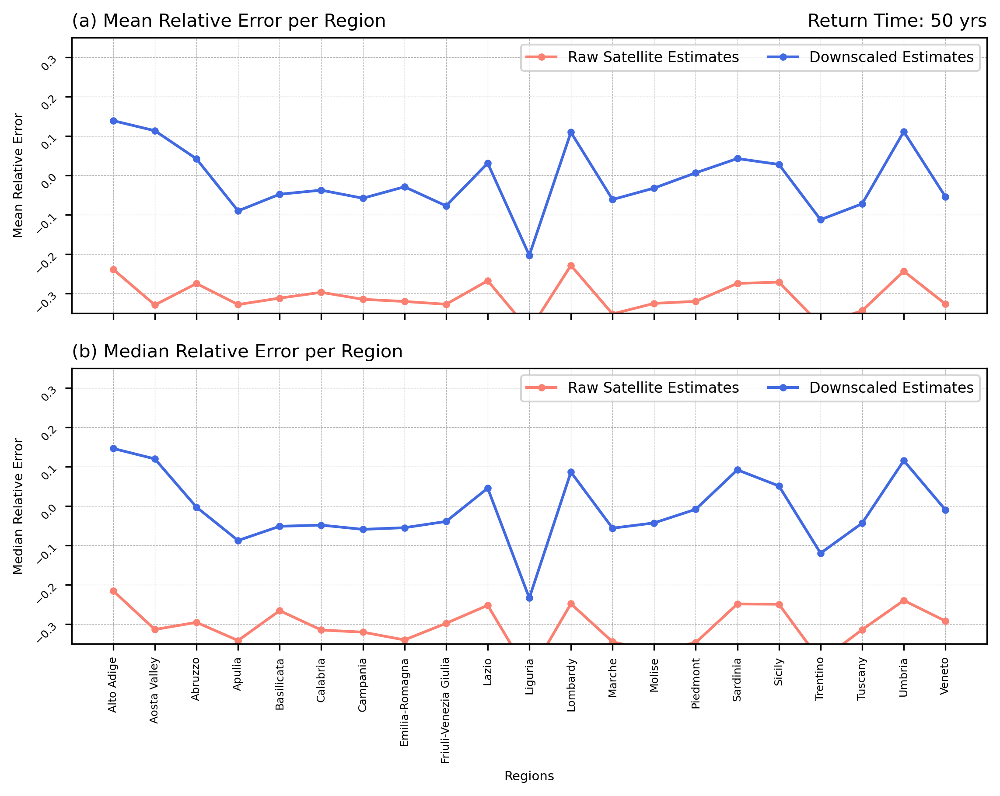

In [56]:
fig = plt.figure(figsize=(9,6),dpi=300)
gs = gridspec.GridSpec(2,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.plot(ISO_names['SAT_RE_mean'].index, ISO_names['SAT_RE_mean'].values, '.-', c='salmon', label='Raw Satellite Estimates')
ax1.plot(ISO_names['DOWN_RE_mean'].index, ISO_names['DOWN_RE_mean'].values, '.-', c='royalblue', label='Downscaled Estimates')

ax1.set_ylabel('Mean Relative Error', fontsize=7)

ax1.set_xticks(ISO_names['SAT_RE_mean'].index)
ax1.set_xticklabels([])

ax1.grid(linewidth=0.3, linestyle='--')
ax1.legend(ncol=2,fontsize=8,loc=0)
ax1.tick_params(axis='both', which='major', labelsize=6, labelrotation=90)

ax1.set_title('(a) Mean Relative Error per Region', fontsize=10, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=10, loc='right')

ax1.tick_params(axis='y', which='major', labelsize=6, rotation=45) 

ax1.set_ylim(-0.35,0.35)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])
ax1.plot(ISO_names['SAT_RE_median'].index, ISO_names['SAT_RE_median'].values, '.-', c='salmon', label='Raw Satellite Estimates')
ax1.plot(ISO_names['DOWN_RE_median'].index, ISO_names['DOWN_RE_median'].values, '.-', c='royalblue', label='Downscaled Estimates')

ax1.set_ylabel('Median Relative Error', fontsize=7)
ax1.set_xlabel('Regions', fontsize=7)

ax1.set_xticks(ISO_names['SAT_RE_median'].index)
ax1.set_xticklabels(ISO_names['Region'])

ax1.grid(linewidth=0.3, linestyle='--')
ax1.legend(ncol=2,fontsize=8,loc=0)
ax1.tick_params(axis='both', which='major', labelsize=6, labelrotation=90)

ax1.set_title('(b) Median Relative Error per Region', fontsize=10, loc='left')

ax1.tick_params(axis='y', which='major', labelsize=6, rotation=45) 

ax1.set_ylim(-0.35,0.35)

# ============================================================================================================================
salida = os.path.join('..','figures','Article_down','mean_median.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Add Geometry in ISO_names

In [57]:
REGIONS_merged = REGIONS.merge(ISO_names, on="Region")

## Spatial Mean Relative Error

In [58]:
print(np.nanmin([np.nanmin(ISO_names["SAT_RE_mean"]),np.nanmin(ISO_names["DOWN_RE_mean"])]), np.nanmax([np.nanmax(ISO_names["SAT_RE_mean"]),np.nanmax(ISO_names["DOWN_RE_mean"])]))

cmap="Reds_r"
# cmap="coolwarm_r"
CBAR_vals = plt.cm.ScalarMappable(
    cmap=cmap,
    norm=plt.Normalize(
        vmin=-0.3,
        vmax=0.3))

-0.3942887767079133 0.1387120942196632


/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


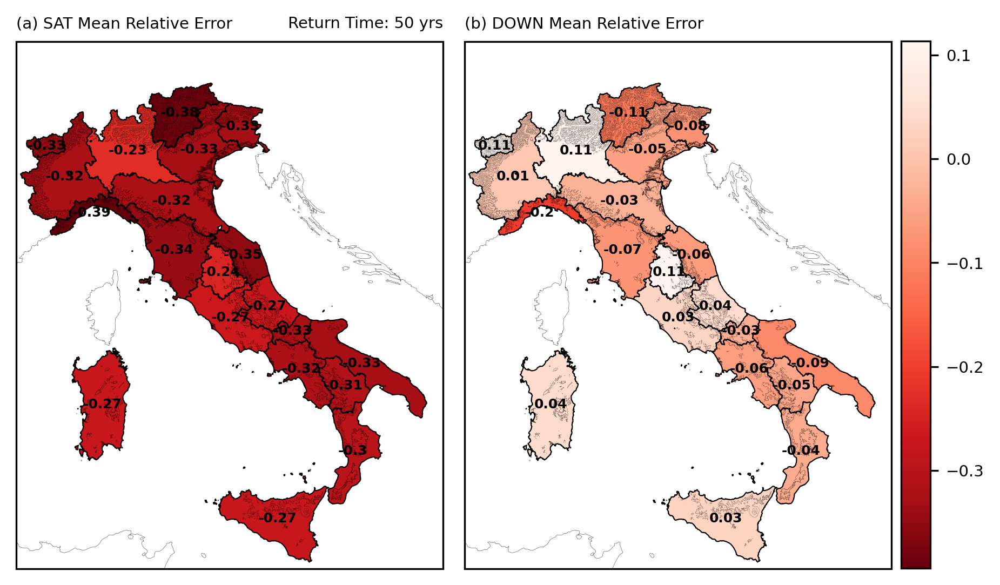

In [59]:
# 1️⃣ Definir un rango común para ambas columnas
vmin = min(REGIONS_merged["SAT_RE_mean"].min(), REGIONS_merged["DOWN_RE_mean"].min())
vmax = max(REGIONS_merged["SAT_RE_mean"].max(), REGIONS_merged["DOWN_RE_mean"].max())

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

# ============================================================================================================================
proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(
    column="SAT_RE_mean", cmap=cmap, norm=norm,  # 👈 usar mismo norm
    legend=False, edgecolor="black", linewidth=0.5, ax=ax1
)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

# agregar textos
for idx, row in REGIONS.iterrows():
    lon_c, lat_c = row['geometry'].centroid.xy
    lon_c, lat_c = lon_c[0], lat_c[0]
    val_mean_tmp = np.round(REGIONS_merged.loc[REGIONS_merged['Region']==row['Region'], 'SAT_RE_mean'].values[0],2)
    ax1.text(lon_c, lat_c, val_mean_tmp, fontsize=6, color="k", 
            ha='center', va='center', fontweight='bold', zorder=50)

ax1.set_title('(a) SAT Mean Relative Error', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

# ============================================================================================================================
ax2 = plt.subplot(gs[0, 1], projection = proj)
ax2.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax2.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(
    column="DOWN_RE_mean", cmap=cmap, norm=norm,  # 👈 mismo norm
    legend=False, edgecolor="black", linewidth=0.5, ax=ax2
)
DEM.plot(facecolor='None', edgecolor='k', ax=ax2, linewidth=0.1, zorder=21, alpha=0.5)

# textos
for idx, row in REGIONS.iterrows():
    lon_c, lat_c = row['geometry'].centroid.xy
    lon_c, lat_c = lon_c[0], lat_c[0]
    val_mean_tmp = np.round(REGIONS_merged.loc[REGIONS_merged['Region']==row['Region'], 'DOWN_RE_mean'].values[0],2)
    ax2.text(lon_c, lat_c, val_mean_tmp, fontsize=6, color="k", 
            ha='center', va='center', fontweight='bold', zorder=50)

ax2.set_title('(b) DOWN Mean Relative Error', fontsize=7, loc='left')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.1)

# 2️⃣ Crear colorbar usando la misma normalización
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []  # truco para que matplotlib lo acepte
cbar_ax = fig.add_axes([0.96, 0.094, 0.03, 0.813])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=7)


In [60]:
# proj = ccrs.PlateCarree()

# fig = plt.figure(figsize=(6,4),dpi=300)
# gs = gridspec.GridSpec(1,2)

# # ============================================================================================================================
# ax1 = plt.subplot(gs[0, 0], projection = proj)
# ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)

# im = REGIONS_merged.plot(column="SAT_RE_mean", cmap=cmap, legend=False, edgecolor="black", linewidth=0.5, ax=ax1)

# for idx, row in REGIONS.iterrows():
#     lon_c, lat_c = row['geometry'].centroid.xy
#     lon_c = lon_c[0]
#     lat_c = lat_c[0]

#     val_mean_tmp = np.round(REGIONS_merged[REGIONS_merged['Region']==row['Region']]['SAT_RE_mean'].values[0],2)
#     ax1.text(
#         lon_c, lat_c, val_mean_tmp, 
#         fontsize=6, color="k", 
#         ha='center', va='center', fontweight='bold', zorder=50
#     )

# ax1.axis('off')

# # ============================================================================================================================
# ax1 = plt.subplot(gs[0, 1], projection = proj)
# ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)

# im = REGIONS_merged.plot(column="DOWN_RE_mean", cmap=cmap,legend=False, edgecolor="black", linewidth=0.5, ax=ax1)

# for idx, row in REGIONS.iterrows():
#     lon_c, lat_c = row['geometry'].centroid.xy
#     lon_c = lon_c[0]
#     lat_c = lat_c[0]

#     val_mean_tmp = np.round(REGIONS_merged[REGIONS_merged['Region']==row['Region']]['DOWN_RE_mean'].values[0],2)
#     ax1.text(
#         lon_c, lat_c, val_mean_tmp, 
#         fontsize=6, color="k", 
#         ha='center', va='center', fontweight='bold', zorder=50
#     )

# ax1.axis('off')

# # ============================================================================================================================
# plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.0, hspace=-0.1)

# fig.patch.set_alpha(0)

# # salida = '../figures/QERROR/SAT_DOWN_RE.png'
# # print(salida)
# # plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Spatial Scatter plot

In [61]:
# RE_DOWN_ALL, RE_DOWN_ALL_NORM, LAT_DOWN_ALL, LON_DOWN_ALL = [], [], [], []
# RE_SAT_ALL, RE_SAT_ALL_NORM, LAT_SAT_ALL, LON_SAT_ALL = [], [], [], []
# for pos in range(len(dict_keys)):
#     RE_DOWN_tmp = DOWN_RE[dict_keys[pos]].values
#     RE_SAT_tmp = SAT_RE[dict_keys[pos]].values


#     RE_DOWN_lat = DOWN_RE_LAT[dict_keys[pos]].values
#     RE_DOWN_lon = DOWN_RE_LON[dict_keys[pos]].values

#     RE_SAT_lat = SAT_RE_LAT[dict_keys[pos]].values
#     RE_SAT_lon = SAT_RE_LON[dict_keys[pos]].values

#     RE_DOWN_lat = RE_DOWN_lat[~np.isnan(RE_SAT_tmp)]
#     RE_DOWN_lon = RE_DOWN_lon[~np.isnan(RE_SAT_tmp)]
#     RE_DOWN_tmp = RE_DOWN_tmp[~np.isnan(RE_SAT_tmp)]

#     RE_SAT_lat = RE_SAT_lat[~np.isnan(RE_SAT_tmp)]
#     RE_SAT_lon = RE_SAT_lon[~np.isnan(RE_SAT_tmp)]
#     RE_SAT_tmp = RE_SAT_tmp[~np.isnan(RE_SAT_tmp)]

#     val_DOWN = abs(RE_DOWN_tmp)
#     val_SAT = abs(RE_SAT_tmp)

#     val_DOWN_norm = (val_DOWN - np.min(val_DOWN))/(np.nanmax(val_DOWN) - np.min(val_DOWN))
#     val_SAT_norm = (val_SAT - np.min(val_SAT))/(np.nanmax(val_SAT) - np.min(val_SAT))
    
#     RE_DOWN_ALL.extend(RE_DOWN_tmp)
#     RE_DOWN_ALL_NORM.extend(val_DOWN_norm)
#     LAT_DOWN_ALL.extend(RE_DOWN_lat)
#     LON_DOWN_ALL.extend(RE_DOWN_lon)
    
#     RE_SAT_ALL.extend(RE_SAT_tmp)
#     RE_SAT_ALL_NORM.extend(val_SAT_norm)
#     LAT_SAT_ALL.extend(RE_SAT_lat)
#     LON_SAT_ALL.extend(RE_SAT_lon)

RE_DOWN_ALL, RE_DOWN_ALL_NORM, LAT_DOWN_ALL, LON_DOWN_ALL = [], [], [], []
for pos in range(len(dict_keys)):
    RE_DOWN_tmp = DOWN_RE[dict_keys[pos]].values
    RE_DOWN_lat = OBS_RE_LAT[dict_keys[pos]].values
    RE_DOWN_lon = OBS_RE_LON[dict_keys[pos]].values

    RE_DOWN_lat = RE_DOWN_lat[~np.isnan(RE_DOWN_tmp)]
    RE_DOWN_lon = RE_DOWN_lon[~np.isnan(RE_DOWN_tmp)]
    RE_DOWN_tmp = RE_DOWN_tmp[~np.isnan(RE_DOWN_tmp)]

    val_DOWN = abs(RE_DOWN_tmp)
    val_DOWN_norm = (val_DOWN - np.min(val_DOWN))/(np.nanmax(val_DOWN) - np.min(val_DOWN))
    
    RE_DOWN_ALL.extend(RE_DOWN_tmp)
    RE_DOWN_ALL_NORM.extend(val_DOWN_norm)
    LAT_DOWN_ALL.extend(RE_DOWN_lat)
    LON_DOWN_ALL.extend(RE_DOWN_lon)

RE_SAT_ALL, RE_SAT_ALL_NORM, LAT_SAT_ALL, LON_SAT_ALL = [], [], [], []
for pos in range(len(dict_keys)):
    RE_SAT_tmp = SAT_RE[dict_keys[pos]].values
    RE_SAT_lat = OBS_RE_LAT[dict_keys[pos]].values
    RE_SAT_lon = OBS_RE_LON[dict_keys[pos]].values

    RE_SAT_lat = RE_SAT_lat[~np.isnan(RE_SAT_tmp)]
    RE_SAT_lon = RE_SAT_lon[~np.isnan(RE_SAT_tmp)]
    RE_SAT_tmp = RE_SAT_tmp[~np.isnan(RE_SAT_tmp)]

    val_SAT = abs(RE_SAT_tmp)
    val_SAT_norm = (val_SAT - np.min(val_SAT))/(np.nanmax(val_SAT) - np.min(val_SAT))
    
    RE_SAT_ALL.extend(RE_SAT_tmp)
    RE_SAT_ALL_NORM.extend(val_SAT_norm)
    LAT_SAT_ALL.extend(RE_SAT_lat)
    LON_SAT_ALL.extend(RE_SAT_lon)

In [62]:
levels = np.arange(-1,1.1,0.1)
# ticks = np.arange(-1.6,2.0,0.4)

norm = mcolors.BoundaryNorm(boundaries=levels, ncolors=256)

In [63]:
np.min(RE_SAT_ALL), np.max(RE_SAT_ALL), np.min(RE_DOWN_ALL), np.max(RE_DOWN_ALL)

(np.float64(-0.8060550130224062),
 np.float64(0.3608947557875525),
 np.float64(-0.6977632469846041),
 np.float64(0.9598811662193129))

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Export figure to: ../figures/Article_down/figure8.png


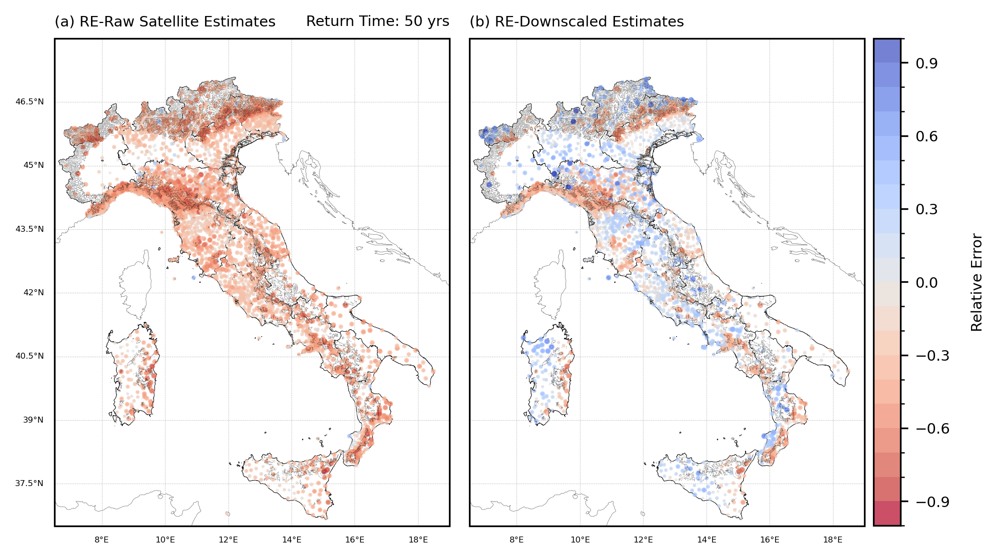

In [64]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_SAT_ALL, LAT_SAT_ALL, c=RE_SAT_ALL, cmap='coolwarm_r', s=np.array(RE_SAT_ALL_NORM)*3, alpha=0.7, norm=norm, zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) RE-Raw Satellite Estimates', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_DOWN_ALL, LAT_DOWN_ALL, c=RE_DOWN_ALL, cmap='coolwarm_r', s=np.array(RE_DOWN_ALL_NORM)*3, alpha=0.7, norm=norm, zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(b) RE-Downscaled Estimates', fontsize=7, loc='left')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.1)

cbar_ax = fig.add_axes([0.96, 0.094, 0.03, 0.813])#0.96
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=7)
cbar.set_label("Relative Error", fontsize=7, labelpad=10)  

salida = os.path.join('..','figures','Article_down','figure8.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [65]:
SAT_vals = RE_SAT_ALL
SAT_sorted_vals = np.sort(SAT_vals)
SAT_cdf = np.arange(1, len(SAT_sorted_vals) + 1) / len(SAT_sorted_vals)

DOWN_vals = RE_DOWN_ALL
DOWN_sorted_vals = np.sort(DOWN_vals)
DOWN_cdf = np.arange(1, len(DOWN_sorted_vals) + 1) / len(DOWN_sorted_vals)

/tmp/ipykernel_20263/1541508410.py:60: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend(fontsize=6)


../figures/Article_down/Ensemble_CDF_boxplot.png


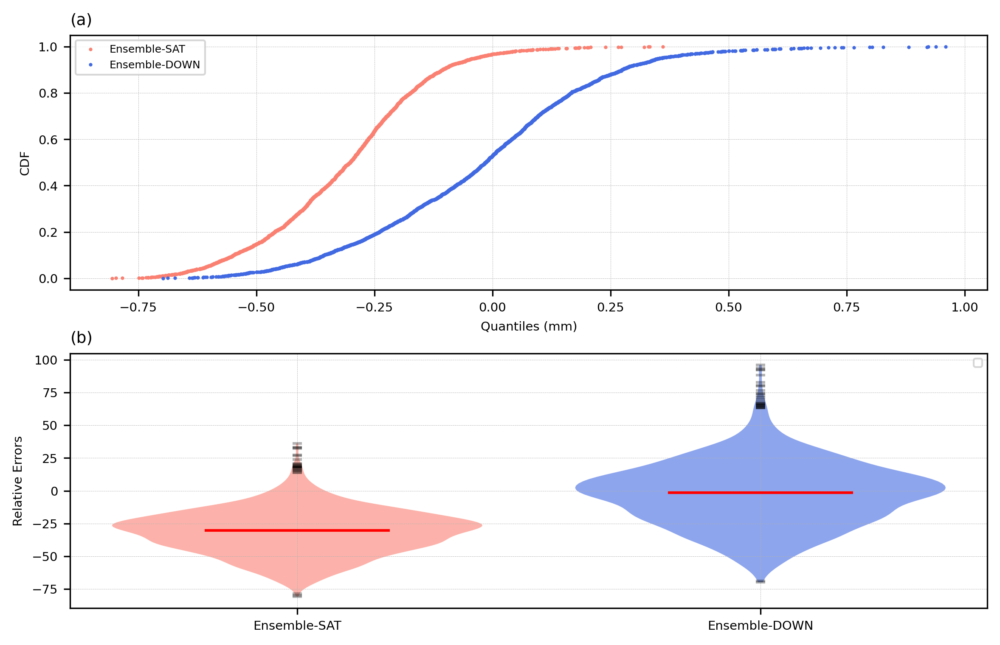

In [66]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(8,5),dpi=300)
gs = gridspec.GridSpec(2,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.plot(SAT_sorted_vals, SAT_cdf, marker=".", linestyle="none", color='salmon', markersize=2, label='Ensemble-SAT')
ax1.plot(DOWN_sorted_vals, DOWN_cdf, marker=".", linestyle="none", color='royalblue', markersize=2, label='Ensemble-DOWN')

ax1.set_xlabel("Quantiles (mm)", fontsize=7)
ax1.set_ylabel("CDF", fontsize=7)
ax1.set_title(f'(a)', loc='left', fontsize=9)
ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])
SAT_tmp = np.array(RE_SAT_ALL)*100
SAT_vio = ax1.violinplot(SAT_tmp, positions=[0], widths=0.4,
                        showmeans=False, showextrema=False, showmedians=True)
for b in SAT_vio['bodies']:
    b.set_facecolor(SAT_color)
    b.set_alpha(0.6)
SAT_vio['cmedians'].set_color("r")
SAT_bodies.append(SAT_vio['bodies'][0])

Q1 = np.percentile(SAT_tmp, 25)
Q3 = np.percentile(SAT_tmp, 75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers_SAT = SAT_tmp[(SAT_tmp < lower_bound) | (SAT_tmp > upper_bound)]
ax1.scatter(np.repeat(0, len(outliers_SAT)), outliers_SAT, alpha=0.3,
            color="k", marker="_", s=30, zorder=20, label="Outliers" if pos==0 else "")

DOWN_tmp = np.array(RE_DOWN_ALL)*100
DOWN_vio = ax1.violinplot(DOWN_tmp, positions=[0.5], widths=0.4,
                            showmeans=False, showextrema=False, showmedians=True)
for b in DOWN_vio['bodies']:
    b.set_facecolor(DOWN_color)
    b.set_alpha(0.6)
DOWN_vio['cmedians'].set_color("r")
DOWN_bodies.append(DOWN_vio['bodies'][0])

Q1 = np.percentile(DOWN_tmp, 25)
Q3 = np.percentile(DOWN_tmp, 75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers_DOWN = DOWN_tmp[(DOWN_tmp < lower_bound) | (DOWN_tmp > upper_bound)]
ax1.scatter(np.repeat(0.5, len(outliers_DOWN)), outliers_DOWN, alpha=0.3,
            color="k", marker="_", s=30, zorder=20, label="Outliers" if pos==0 else "")

ax1.set_ylabel("Relative Errors", fontsize=7)
ax1.set_title(f'(b)', loc='left', fontsize=9)
ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=6)
ax1.set_xticks([0,0.5])
ax1.set_xticklabels(['Ensemble-SAT','Ensemble-DOWN'])

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.08, hspace=0.25)

salida = '../figures/Article_down/Ensemble_CDF_boxplot.png'
print(salida)
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [67]:
p_min = 2
p_max = 98

RE_DOWN_ALL = np.array(RE_DOWN_ALL)
LON_DOWN_ALL = np.array(LON_DOWN_ALL)
LAT_DOWN_ALL = np.array(LAT_DOWN_ALL)

RE_DOWN_ALL_P5 = RE_DOWN_ALL[RE_DOWN_ALL<np.percentile(RE_DOWN_ALL,p_min)]
LON_DOWN_ALL_P5 = LON_DOWN_ALL[RE_DOWN_ALL<np.percentile(RE_DOWN_ALL,p_min)]
LAT_DOWN_ALL_P5 = LAT_DOWN_ALL[RE_DOWN_ALL<np.percentile(RE_DOWN_ALL,p_min)]

RE_DOWN_ALL_P95 = RE_DOWN_ALL[RE_DOWN_ALL>np.percentile(RE_DOWN_ALL,p_max)]
LON_DOWN_ALL_P95 = LON_DOWN_ALL[RE_DOWN_ALL>np.percentile(RE_DOWN_ALL,p_max)]
LAT_DOWN_ALL_P95 = LAT_DOWN_ALL[RE_DOWN_ALL>np.percentile(RE_DOWN_ALL,p_max)]

RE_DOWN_ALL_P5_norm = (abs(RE_DOWN_ALL_P5) - np.min(abs(RE_DOWN_ALL_P5)))/(np.nanmax(abs(RE_DOWN_ALL_P5)) - np.min(abs(RE_DOWN_ALL_P5)))
RE_DOWN_ALL_P95_norm = (abs(RE_DOWN_ALL_P95) - np.min(abs(RE_DOWN_ALL_P95)))/(np.nanmax(abs(RE_DOWN_ALL_P95)) - np.min(abs(RE_DOWN_ALL_P95)))

In [68]:
levels_P5 = np.arange(-0.8,-0.5,0.05)
norm_P5 = mcolors.BoundaryNorm(boundaries=levels_P5, ncolors=256)

levels_P95 = np.arange(0.3,1.0,0.1)
norm_P95 = mcolors.BoundaryNorm(boundaries=levels_P95, ncolors=256)

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Export figure to: ../figures/Article_down/figure9.png


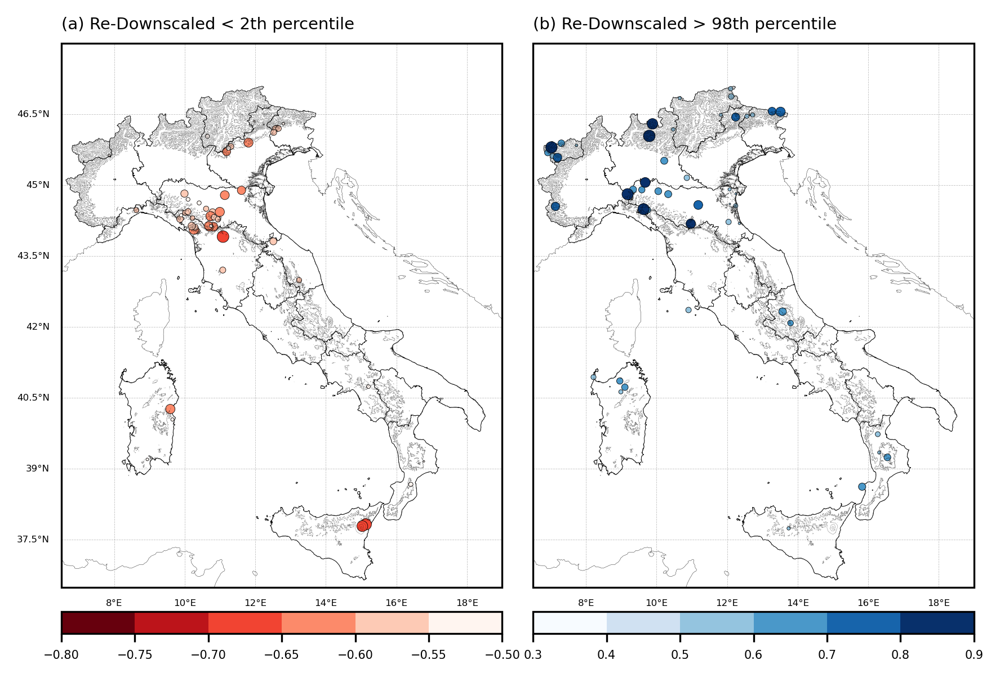

In [69]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_DOWN_ALL_P5, LAT_DOWN_ALL_P5, c=RE_DOWN_ALL_P5, cmap='Reds_r', s=RE_DOWN_ALL_P5_norm*25, alpha=1, norm=norm_P5, zorder=20, edgecolors='black', linewidths=0.2)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04, orientation='horizontal')
cbar.ax.tick_params(labelsize=5) 

ax1.set_title(f'(a) Re-Downscaled < {p_min}th percentile', fontsize=7, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_DOWN_ALL_P95, LAT_DOWN_ALL_P95, c=RE_DOWN_ALL_P95, cmap='Blues', s=RE_DOWN_ALL_P95_norm*25, alpha=1, norm=norm_P95, zorder=20, edgecolors='black', linewidths=0.2)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04, orientation='horizontal')
cbar.ax.tick_params(labelsize=5) 

ax1.set_title(f'(b) Re-Downscaled > {p_max}th percentile', fontsize=7, loc='left')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.07, hspace=0.1)

salida = os.path.join('..','figures','Article_down','figure9.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Difference

In [70]:
levels_dif = np.arange(-0.5,0.6,0.1)

norm_diff = mcolors.BoundaryNorm(boundaries=levels_dif, ncolors=256)

Text(1.0, 1.0, 'Return Time: 50 yrs')

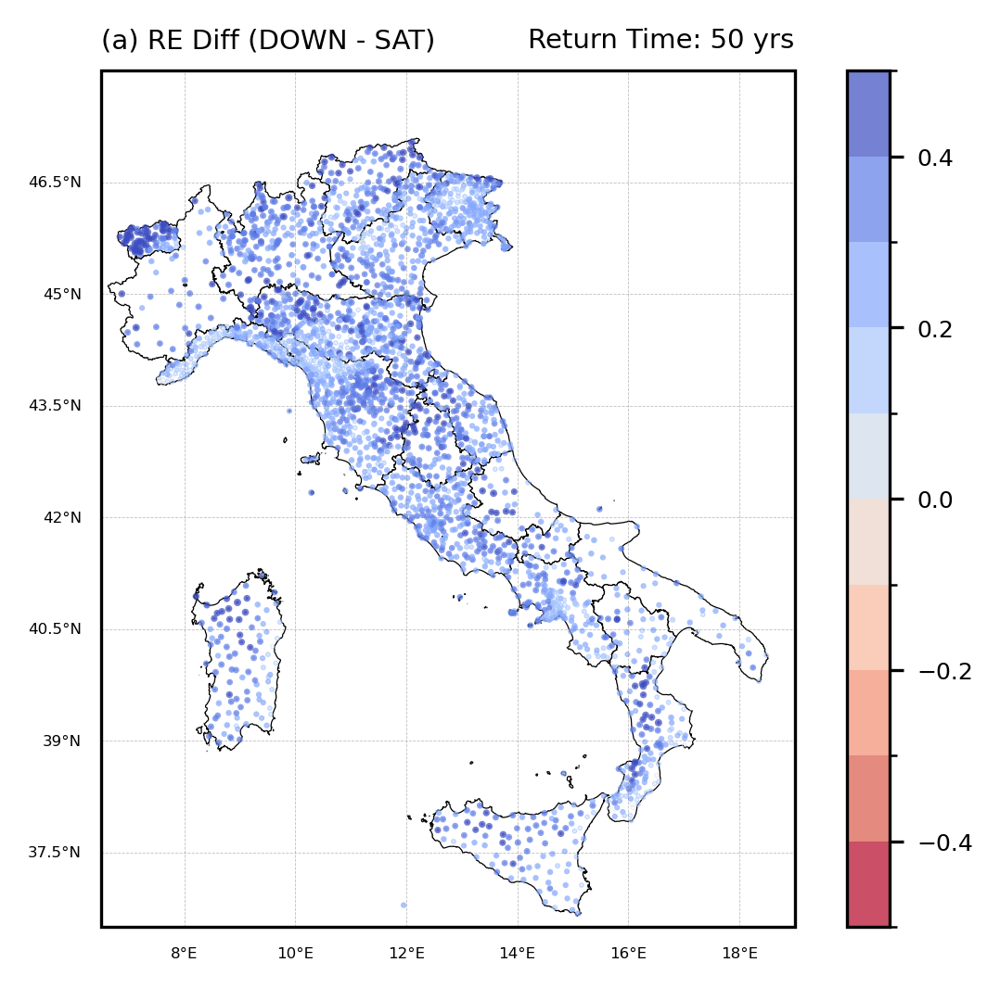

In [71]:
DIFF = (np.array(RE_DOWN_ALL))-(np.array(RE_SAT_ALL))
DIFF_NORM = (DIFF - np.nanmin(DIFF))/(np.nanmax(DIFF) - np.nanmin(DIFF))

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.3, ax=ax1)
a1 = ax1.scatter(LON_DOWN_ALL, LAT_DOWN_ALL, c=DIFF, cmap='coolwarm_r', s=DIFF_NORM, alpha=0.7, norm=norm_diff)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) RE Diff (DOWN - SAT)', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

## Weibull Parameters

In [72]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'OBS_Weibull_N.csv')
OBS_N = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'OBS_Weibull_C.csv')
OBS_C = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'OBS_Weibull_W.csv')
OBS_W = pd.read_csv(dir_in)

In [73]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'SAT_ensemble_Weibull_N.csv')
SAT_N = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'SAT_ensemble_Weibull_C.csv')
SAT_C = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'SAT_ensemble_Weibull_W.csv')
SAT_W = pd.read_csv(dir_in)

In [74]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'DOWN_ensemble_Weibull_N.csv')
DOWN_N = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'DOWN_ensemble_Weibull_C.csv')
DOWN_C = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'DOWN_ensemble_Weibull_W.csv')
DOWN_W = pd.read_csv(dir_in)

In [75]:
OBS_N_data = OBS_N.to_numpy().reshape(-1,1)
SAT_N_data = SAT_N.to_numpy().reshape(-1,1)
DOWN_N_data = DOWN_N.to_numpy().reshape(-1,1)

OBS_C_data = OBS_C.to_numpy().reshape(-1,1)
SAT_C_data = SAT_C.to_numpy().reshape(-1,1)
DOWN_C_data = DOWN_C.to_numpy().reshape(-1,1)

OBS_W_data = OBS_W.to_numpy().reshape(-1,1)
SAT_W_data = SAT_W.to_numpy().reshape(-1,1)
DOWN_W_data = DOWN_W.to_numpy().reshape(-1,1)

In [76]:
N_min = min(np.nanmin(OBS_N_data), np.nanmin(SAT_N_data), np.nanmin(DOWN_N_data))
N_max = max(np.nanmax(OBS_N_data), np.nanmax(SAT_N_data), np.nanmax(DOWN_N_data))

C_min = min(np.nanmin(OBS_C_data), np.nanmin(SAT_C_data), np.nanmin(DOWN_C_data))
C_max = max(np.nanmax(OBS_C_data), np.nanmax(SAT_C_data), np.nanmax(DOWN_C_data))

W_min = min(np.nanmin(OBS_W_data), np.nanmin(SAT_W_data), np.nanmin(DOWN_W_data))
W_max = max(np.nanmax(OBS_W_data), np.nanmax(SAT_W_data), np.nanmax(DOWN_W_data))

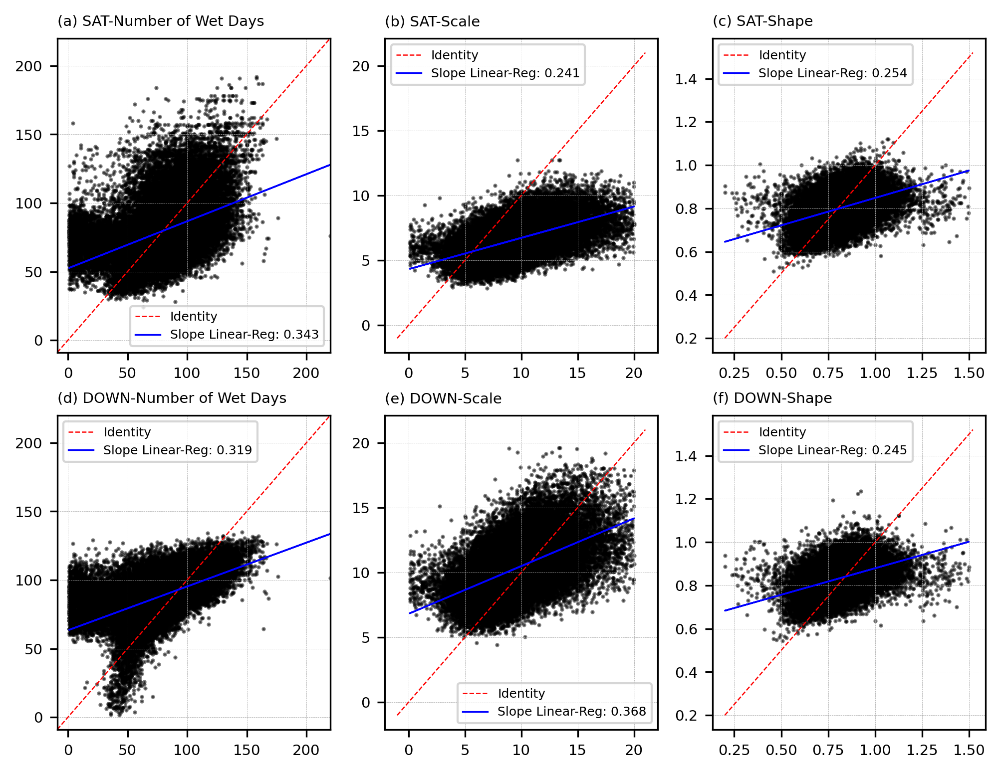

In [77]:
fig = plt.figure(figsize=(8,6),dpi=300)
gs = gridspec.GridSpec(2,3)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(OBS_N_data[~np.isnan(OBS_N_data)], SAT_N_data[~np.isnan(OBS_N_data)], color='k', s=1, alpha=0.5)
ax1.plot([N_min-10, N_max], [N_min-10, N_max], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_N_data[~np.isnan(OBS_N_data)]
y_in = SAT_N_data[~np.isnan(OBS_N_data)]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.set_xlim(N_min-10, N_max)
ax1.set_ylim(N_min-10, N_max)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(a) SAT-Number of Wet Days', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 20
ax1 = plt.subplot(gs[0, 1])
ax1.scatter(OBS_C_data[OBS_C_data<val_max], SAT_C_data[OBS_C_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([-1, 21], [-1, 21], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_C_data[OBS_C_data<val_max]
y_in = SAT_C_data[OBS_C_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(b) SAT-Scale', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 1.5
ax1 = plt.subplot(gs[0, 2])
ax1.scatter(OBS_W_data[OBS_W_data<val_max], SAT_W_data[OBS_W_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([0.2, 1.52], [0.2, 1.52], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_W_data[OBS_W_data<val_max]
y_in = SAT_W_data[OBS_W_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(c) SAT-Shape', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])
ax1.scatter(OBS_N_data[~np.isnan(OBS_N_data)], DOWN_N_data[~np.isnan(OBS_N_data)], color='k', s=1, alpha=0.5)
ax1.plot([N_min-10, N_max], [N_min-10, N_max], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_N_data[~np.isnan(OBS_N_data)]
y_in = DOWN_N_data[~np.isnan(OBS_N_data)]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.set_xlim(N_min-10, N_max)
ax1.set_ylim(N_min-10, N_max)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(d) DOWN-Number of Wet Days', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 20
ax1 = plt.subplot(gs[1, 1])
ax1.scatter(OBS_C_data[OBS_C_data<val_max], DOWN_C_data[OBS_C_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([-1, 21], [-1, 21], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_C_data[OBS_C_data<val_max]
y_in = DOWN_C_data[OBS_C_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(e) DOWN-Scale', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 1.5
ax1 = plt.subplot(gs[1, 2])
ax1.scatter(OBS_W_data[OBS_W_data<val_max], DOWN_W_data[OBS_W_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([0.2, 1.52], [0.2, 1.52], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_W_data[OBS_W_data<val_max]
y_in = DOWN_W_data[OBS_W_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(f) DOWN-Shape', loc='left', fontsize=7)
ax1.legend(fontsize=6)

## Comparison between DOWN and the raw SATELLITE products

In [78]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lat.csv')
OBS_RE_LAT = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lon.csv')
OBS_RE_LON = pd.read_csv(dir_in)

In [79]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_CMORPH_relative_error.csv')
CMORPH_SAT_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_ERA5_relative_error.csv')
ERA5_SAT_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_GSMaP_relative_error.csv')
GSMaP_SAT_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_MSWEP_relative_error.csv')
MSWEP_SAT_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_IMERG_relative_error.csv')
IMERG_SAT_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_CHIRPS_relative_error.csv')
CHIRPS_SAT_RE = pd.read_csv(dir_in)

In [80]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_CMORPH_relative_error.csv')
CMORPH_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_ERA5_relative_error.csv')
ERA5_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_GSMaP_relative_error.csv')
GSMaP_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_MSWEP_relative_error.csv')
MSWEP_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_IMERG_relative_error.csv')
IMERG_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_CHIRPS_relative_error.csv')
CHIRPS_RE = pd.read_csv(dir_in)

In [81]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_ensemble_relative_error.csv')
SAT_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_ensemble_relative_error.csv')
DOWN_RE = pd.read_csv(dir_in)

In [82]:
OBS_RE_LAT = OBS_RE_LAT[~np.isnan(OBS_Q50)]
OBS_RE_LON = OBS_RE_LON[~np.isnan(OBS_Q50)]

SAT_RE = SAT_RE[~np.isnan(OBS_Q50)]
DOWN_RE = DOWN_RE[~np.isnan(OBS_Q50)]

CMORPH_SAT_RE = CMORPH_SAT_RE[~np.isnan(OBS_Q50)]
ERA5_SAT_RE = ERA5_SAT_RE[~np.isnan(OBS_Q50)]
GSMaP_SAT_RE = GSMaP_SAT_RE[~np.isnan(OBS_Q50)]
MSWEP_SAT_RE = MSWEP_SAT_RE[~np.isnan(OBS_Q50)]
IMERG_SAT_RE = IMERG_SAT_RE[~np.isnan(OBS_Q50)]
CHIRPS_SAT_RE = CHIRPS_SAT_RE[~np.isnan(OBS_Q50)]

CMORPH_RE = CMORPH_RE[~np.isnan(OBS_Q50)]
ERA5_RE = ERA5_RE[~np.isnan(OBS_Q50)]
GSMaP_RE = GSMaP_RE[~np.isnan(OBS_Q50)]
MSWEP_RE = MSWEP_RE[~np.isnan(OBS_Q50)]
IMERG_RE = IMERG_RE[~np.isnan(OBS_Q50)]
CHIRPS_RE = CHIRPS_RE[~np.isnan(OBS_Q50)]

In [83]:
SAT_RE_M = SAT_RE.values.flatten()
DOWN_RE_M = DOWN_RE.values.flatten()

CMORPH_SAT_RE_M = CMORPH_SAT_RE.values.flatten()
ERA5_SAT_RE_M = ERA5_SAT_RE.values.flatten()
GSMaP_SAT_RE_M = GSMaP_SAT_RE.values.flatten()
MSWEP_SAT_RE_M = MSWEP_SAT_RE.values.flatten()
IMERG_SAT_RE_M = IMERG_SAT_RE.values.flatten()
CHIRPS_SAT_RE_M = CHIRPS_SAT_RE.values.flatten()

CMORPH_RE_M = CMORPH_RE.values.flatten()
ERA5_RE_M = ERA5_RE.values.flatten()
GSMaP_RE_M = GSMaP_RE.values.flatten() + 0.02
MSWEP_RE_M = MSWEP_RE.values.flatten()
IMERG_RE_M = IMERG_RE.values.flatten()
CHIRPS_RE_M = CHIRPS_RE.values.flatten()

In [84]:
colors = ['royalblue','r', 'g', 'c', 'y', 'purple', 'orange', 'cyan']

../figures/Article_down/Products_DOWN_RE_dist_median.png


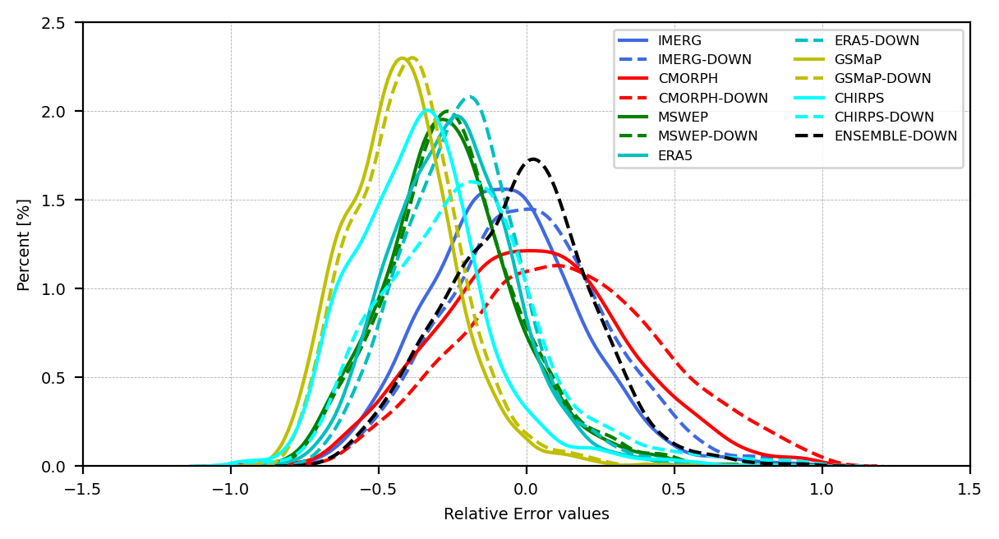

In [107]:
fig = plt.figure(figsize=(6,3),dpi=200)
gs = gridspec.GridSpec(1,1)

# =========================================================================================================================
ax1 = plt.subplot(gs[0, 0])

sns.kdeplot(IMERG_SAT_RE_M,color=colors[0],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG')
sns.kdeplot(IMERG_RE_M,color=colors[0], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG-DOWN')

sns.kdeplot(CMORPH_SAT_RE_M,color=colors[1],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH')
sns.kdeplot(CMORPH_RE_M,color=colors[1], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH-DOWN')

sns.kdeplot(MSWEP_SAT_RE_M,color=colors[2],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP')
sns.kdeplot(MSWEP_RE_M,color=colors[2], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP-DOWN')

sns.kdeplot(ERA5_SAT_RE_M,color=colors[3],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5')
sns.kdeplot(ERA5_RE_M,color=colors[3], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5-DOWN')

sns.kdeplot(GSMaP_SAT_RE_M,color=colors[4],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP')
sns.kdeplot(GSMaP_RE_M,color=colors[4], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP-DOWN')

sns.kdeplot(CHIRPS_SAT_RE_M,color=colors[7],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS')
sns.kdeplot(CHIRPS_RE_M,color=colors[7], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS-DOWN')

sns.kdeplot(DOWN_RE_M,color='k', linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ENSEMBLE-DOWN')

ax1.set_ylabel('Percent [%]',fontsize=7)
ax1.set_xlabel('Relative Error values',fontsize=7)
ax1.legend(fontsize=6, loc=0, ncol=2)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.set_xlim(-1.5,1.5)
ax1.set_ylim(0,2.5)
ax1.tick_params(axis='both', which='major', labelsize=7)

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.08, hspace=0.15)

salida = '../figures/Article_down/Products_DOWN_RE_dist_median.png'
print(salida)
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [86]:
print(f'IMERG SAT mean : {np.round(np.nanmean(IMERG_SAT_RE_M),3)}')
print(f'IMERG DOWN mean: {np.round(np.nanmean(IMERG_RE_M),3)}')
print()
print(f'CMORPH SAT mean : {np.round(np.nanmean(CMORPH_SAT_RE_M),3)}')
print(f'CMORPH DOWN mean: {np.round(np.nanmean(CMORPH_RE_M),3)}')
print()
print(f'MSWEP SAT mean : {np.round(np.nanmean(MSWEP_SAT_RE_M),3)}')
print(f'MSWEP DOWN mean: {np.round(np.nanmean(MSWEP_RE_M),3)}')
print()
print(f'ERA5 SAT mean : {np.round(np.nanmean(ERA5_SAT_RE_M),3)}')
print(f'ERA5 DOWN mean: {np.round(np.nanmean(ERA5_RE_M),3)}')
print()
print(f'GSMaP SAT mean : {np.round(np.nanmean(GSMaP_SAT_RE_M),3)}')
print(f'GSMaP DOWN mean: {np.round(np.nanmean(GSMaP_RE_M),3)}')
print()
print(f'CHIRPS SAT mean : {np.round(np.nanmean(CHIRPS_SAT_RE_M),3)}')
print(f'CHIRPS DOWN mean: {np.round(np.nanmean(CHIRPS_RE_M),3)}')
print()
print(f'ENSEMB SAT mean : {np.round(np.nanmean(SAT_RE_M),3)}')
print(f'ENSEMB DOWN mean: {np.round(np.nanmean(DOWN_RE_M),3)}')

IMERG SAT mean : -0.074
IMERG DOWN mean: 0.001

CMORPH SAT mean : 0.021
CMORPH DOWN mean: 0.126

MSWEP SAT mean : -0.253
MSWEP DOWN mean: -0.239

ERA5 SAT mean : -0.251
ERA5 DOWN mean: -0.217

GSMaP SAT mean : -0.425
GSMaP DOWN mean: -0.398

CHIRPS SAT mean : -0.357
CHIRPS DOWN mean: -0.206

ENSEMB SAT mean : -0.313
ENSEMB DOWN mean: -0.027


../figures/Article_down/Products_DOWN_RE_dist_median.png


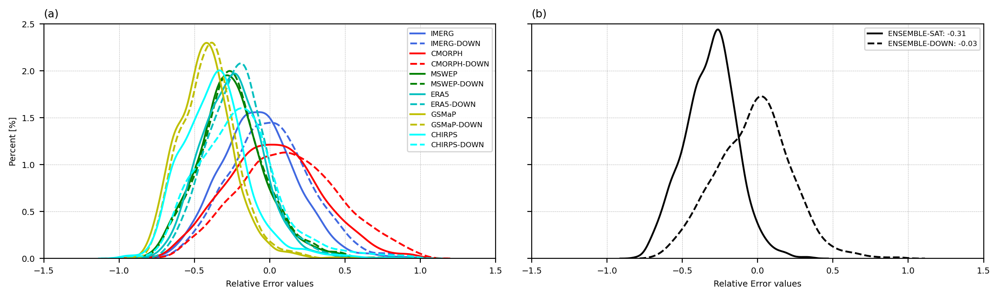

In [87]:
fig = plt.figure(figsize=(12,3),dpi=200)
gs = gridspec.GridSpec(1,2)

# =========================================================================================================================
ax1 = plt.subplot(gs[0, 0])

sns.kdeplot(IMERG_SAT_RE_M,color=colors[0],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG')
sns.kdeplot(IMERG_RE_M,color=colors[0], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG-DOWN')

sns.kdeplot(CMORPH_SAT_RE_M,color=colors[1],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH')
sns.kdeplot(CMORPH_RE_M,color=colors[1], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH-DOWN')

sns.kdeplot(MSWEP_SAT_RE_M,color=colors[2],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP')
sns.kdeplot(MSWEP_RE_M,color=colors[2], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP-DOWN')

sns.kdeplot(ERA5_SAT_RE_M,color=colors[3],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5')
sns.kdeplot(ERA5_RE_M,color=colors[3], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5-DOWN')

sns.kdeplot(GSMaP_SAT_RE_M,color=colors[4],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP')
sns.kdeplot(GSMaP_RE_M,color=colors[4], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP-DOWN')

sns.kdeplot(CHIRPS_SAT_RE_M,color=colors[7],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS')
sns.kdeplot(CHIRPS_RE_M,color=colors[7], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS-DOWN')

# sns.kdeplot(SAT_RE_M,color='k',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ENSEMBLE-SAT')
# sns.kdeplot(DOWN_RE_M,color='k', linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ENSEMBLE-DOWN')

ax1.set_ylabel('Percent [%]',fontsize=7)
ax1.set_xlabel('Relative Error values',fontsize=7)
ax1.legend(fontsize=6, loc=0, ncol=1)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.set_xlim(-1.5,1.5)
ax1.set_ylim(0,2.5)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title(f'(a)',fontsize=9, loc='left')

# =========================================================================================================================
ax1 = plt.subplot(gs[0, 1])

sns.kdeplot(SAT_RE_M,color='k',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ENSEMBLE-SAT: {np.round(np.nanmean(SAT_RE_M),2)}')
sns.kdeplot(DOWN_RE_M,color='k', linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ENSEMBLE-DOWN: {np.round(np.nanmean(DOWN_RE_M),2)}')

ax1.set_xlabel('Relative Error values',fontsize=7)
ax1.legend(fontsize=6, loc=0, ncol=1)
ax1.grid(linewidth=0.3, linestyle='--')

ax1.set_xlim(-1.5,1.5)
ax1.set_ylim(0,2.5)
ax1.set_yticklabels('')
ax1.set_ylabel('')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title(f'(b)',fontsize=9, loc='left')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.08, hspace=0.15)

salida = '../figures/Article_down/Products_DOWN_RE_dist_median.png'
print(salida)
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

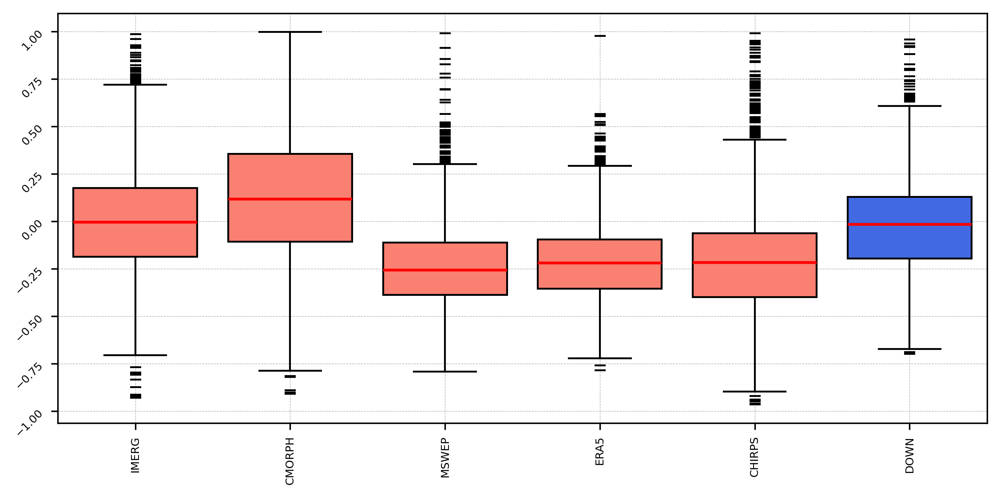

In [88]:
box_width = 0.8
x_pos = np.arange(0.5,42,2)

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []

SAT_tmp = IMERG_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[0],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = CMORPH_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[1],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = MSWEP_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[2],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = ERA5_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[3],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = CHIRPS_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[4],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = DOWN_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[5],
widths=box_width,boxprops=DOWN_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

ax1.set_xticks(np.arange(6))
ax1.set_xticklabels(['IMERG','CMORPH','MSWEP','ERA5','CHIRPS','DOWN'], fontsize=8)

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=6, labelrotation=90)
ax1.tick_params(axis='y', which='major', labelsize=6, rotation=45)

In [89]:
def clear_dict(product):
    
    if product != 'ensemble':
        dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_{product}_OBS_elev.csv')
        ELEV_dict = pd.read_csv(dir_in)

        dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_{product}_OBS_Q50.csv')
        OBS_dict = pd.read_csv(dir_in)

        dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_{product}_Q50.csv')
        SAT_dict = pd.read_csv(dir_in)
    else:
        dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_elev.csv')
        ELEV_dict = pd.read_csv(dir_in)

        dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_Q50.csv')
        OBS_dict = pd.read_csv(dir_in)

        dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_{product}_Q50.csv')
        SAT_dict = pd.read_csv(dir_in)
    
    OBS_elev_flat = ELEV_dict.values.flatten()
    OBS_Q50_flat = OBS_dict.values.flatten()
    SAT_Q50_flat = SAT_dict.values.flatten()

    mask = np.where((~np.isnan(OBS_elev_flat))&(~np.isnan(OBS_Q50_flat))&(~np.isnan(SAT_Q50_flat)))

    OBS_elev_clear = OBS_elev_flat[mask]
    OBS_Q50_clear = OBS_Q50_flat[mask]
    SAT_Q50_clear = SAT_Q50_flat[mask]    
    
    sort_idx = np.argsort(OBS_elev_clear)
    OBS_elev_sorted = OBS_elev_clear[sort_idx]
    OBS_Q50_sorted = OBS_Q50_clear[sort_idx]
    SAT_Q50_sorted = SAT_Q50_clear[sort_idx]

    OBS_elev_norm = (OBS_elev_sorted-np.min(OBS_elev_sorted))/(np.max(OBS_elev_sorted)-np.min(OBS_elev_sorted))*30
    
    return OBS_elev_sorted, OBS_Q50_sorted, SAT_Q50_sorted, OBS_elev_norm

In [90]:
CMORPH_OBS_elev, CMORPH_OBS_Q50, CMORPH_DOWN_Q50, CMORPH_OBS_ELEV_norm = clear_dict('CMORPH')
ERA5_OBS_elev, ERA5_OBS_Q50, ERA5_DOWN_Q50, ERA5_OBS_ELEV_norm = clear_dict('ERA5')
GSMaP_OBS_elev, GSMaP_OBS_Q50, GSMaP_DOWN_Q50, GSMaP_OBS_ELEV_norm = clear_dict('GSMaP')
MSWEP_OBS_elev, MSWEP_OBS_Q50, MSWEP_DOWN_Q50, MSWEP_OBS_ELEV_norm = clear_dict('MSWEP')
IMERG_OBS_elev, IMERG_OBS_Q50, IMERG_DOWN_Q50, IMERG_OBS_ELEV_norm = clear_dict('IMERG')
CHIRPS_OBS_elev, CHIRPS_OBS_Q50, CHIRPS_DOWN_Q50, CHIRPS_OBS_ELEV_norm = clear_dict('CHIRPS')

ENSEMBLE_OBS_elev, ENSEMBLE_OBS_Q50, ENSEMBLE_DOWN_Q50, ENSEMBLE_OBS_ELEV_norm = clear_dict('ensemble')

In [91]:
def linear_regression(OBS,DOWN):
    mask = ~np.isnan(OBS) & ~np.isnan(DOWN)
    obs_clean = OBS[mask].reshape(-1,1) 
    down_clean = DOWN[mask]

    reg = LinearRegression()
    reg.fit(obs_clean, down_clean)

    x_line = np.linspace(np.min(obs_clean), np.max(obs_clean), 100).reshape(-1,1)
    y_line = reg.predict(x_line)

    return x_line, y_line

In [92]:
CMORPH_SAT_x, CMORPH_SAT_y = linear_regression(CMORPH_OBS_Q50, CMORPH_DOWN_Q50)
ERA5_SAT_x, ERA5_SAT_y = linear_regression(ERA5_OBS_Q50, ERA5_DOWN_Q50)
GSMaP_SAT_x, GSMaP_SAT_y = linear_regression(GSMaP_OBS_Q50, GSMaP_DOWN_Q50)
IMERG_SAT_x, IMERG_SAT_y = linear_regression(IMERG_OBS_Q50, IMERG_DOWN_Q50)
MSWEP_SAT_x, MSWEP_SAT_y = linear_regression(MSWEP_OBS_Q50, MSWEP_DOWN_Q50)
CHIRPS_SAT_x, CHIRPS_SAT_y = linear_regression(CHIRPS_OBS_Q50, CHIRPS_DOWN_Q50)
ENSEMBLE_DOWN_x, ENSEMBLE_DOWN_y = linear_regression(ENSEMBLE_OBS_Q50, ENSEMBLE_DOWN_Q50)

In [93]:
vmin = ENSEMBLE_OBS_elev.min()
vmax = ENSEMBLE_OBS_elev.max()
vmin, vmax

(np.float64(-3.0), np.float64(3013.10009765625))

../figures/Article_down/Products_DOWN_Scatter.png


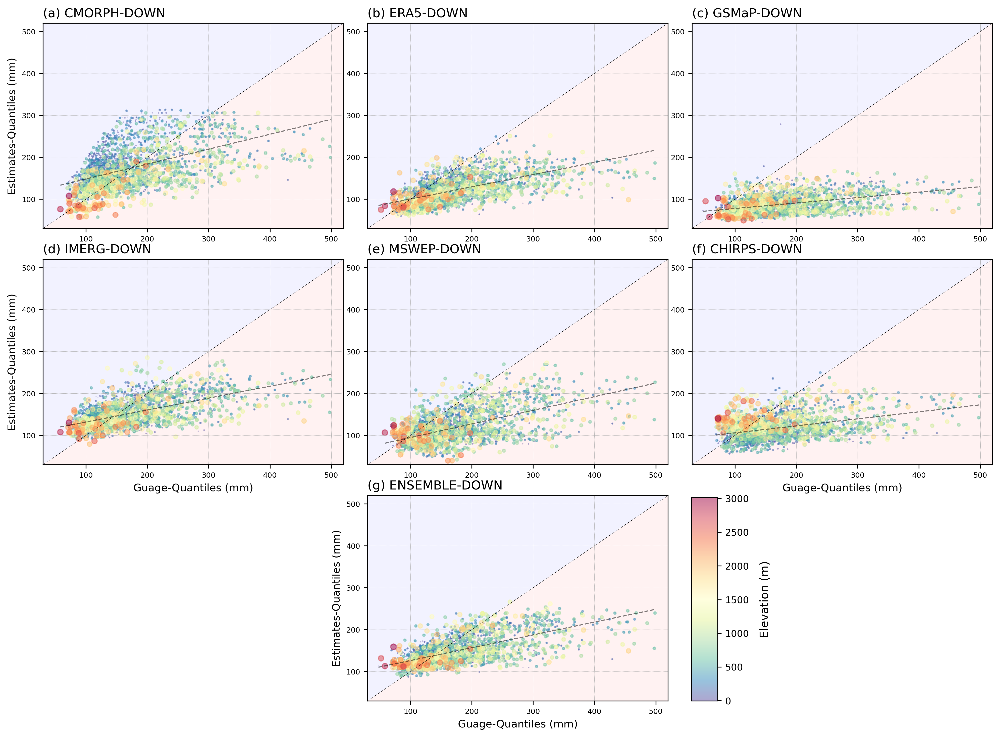

In [94]:
fig = plt.figure(figsize=(14,10),dpi=300)
gs = gridspec.GridSpec(3,3)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    CMORPH_OBS_Q50, CMORPH_DOWN_Q50,
    alpha=0.5,
    s=CMORPH_OBS_ELEV_norm,
    c=CMORPH_OBS_elev,
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(CMORPH_SAT_x, CMORPH_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(a) CMORPH-DOWN', loc='left', fontsize=12)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    ERA5_OBS_Q50, ERA5_DOWN_Q50,
    alpha=0.5,
    s=ERA5_OBS_ELEV_norm,
    c=ERA5_OBS_elev,
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(ERA5_SAT_x, ERA5_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(b) ERA5-DOWN', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    GSMaP_OBS_Q50, GSMaP_DOWN_Q50,
    alpha=0.5,
    s=GSMaP_OBS_ELEV_norm,
    c=GSMaP_OBS_elev,
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(GSMaP_SAT_x, GSMaP_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(c) GSMaP-DOWN', loc='left', fontsize=12)

# ============================================================================================================================
# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    IMERG_OBS_Q50, IMERG_DOWN_Q50,
    alpha=0.5,
    s=IMERG_OBS_ELEV_norm,
    c=IMERG_OBS_elev,
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(IMERG_SAT_x, IMERG_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(d) IMERG-DOWN', loc='left', fontsize=12)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=10)
ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 1])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    MSWEP_OBS_Q50, MSWEP_DOWN_Q50,
    alpha=0.5,
    s=MSWEP_OBS_ELEV_norm,
    c=MSWEP_OBS_elev,
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(MSWEP_SAT_x, MSWEP_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(e) MSWEP-DOWN', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 2])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    CHIRPS_OBS_Q50, CHIRPS_DOWN_Q50,
    alpha=0.5,
    s=CHIRPS_OBS_ELEV_norm,
    c=CHIRPS_OBS_elev,
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(CHIRPS_SAT_x, CHIRPS_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(f) CHIRPS-DOWN', loc='left', fontsize=12)
ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
ax1 = plt.subplot(gs[2, 1])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    ENSEMBLE_OBS_Q50, ENSEMBLE_DOWN_Q50,
    alpha=0.5,
    s=ENSEMBLE_OBS_ELEV_norm,
    c=ENSEMBLE_OBS_elev,
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(ENSEMBLE_DOWN_x, ENSEMBLE_DOWN_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(g) ENSEMBLE-DOWN', loc='left', fontsize=12)

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.08, hspace=0.17)

# cbar_ax = fig.add_axes([0.96, 0.094, 0.03, 0.813])#0.96
# cbar = fig.colorbar(a1, cax=cbar_ax, orientation='vertical')
# cbar.ax.tick_params(labelsize=9)
# cbar.set_label("Elevation (m)", fontsize=11, labelpad=10)  

cbar_ax = fig.add_axes([0.6645, 0.05, 0.025, 0.27])#0.96
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=9)
cbar.set_label("Elevation (m)", fontsize=11, labelpad=10)  

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.08, hspace=0.15)

salida = '../figures/Article_down/Products_DOWN_Scatter.png'
print(salida)
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [95]:
elevation_min, elevation_max = 2000, 4000
# elevation_min, elevation_max = 1200, 2200

In [96]:
CMORPH_SAT_x, CMORPH_SAT_y = linear_regression(CMORPH_OBS_Q50[(CMORPH_OBS_elev>=elevation_min)&(CMORPH_OBS_elev<elevation_max)], 
                                            CMORPH_DOWN_Q50[(CMORPH_OBS_elev>=elevation_min)&(CMORPH_OBS_elev<elevation_max)])

ERA5_SAT_x, ERA5_SAT_y = linear_regression(ERA5_OBS_Q50[(ERA5_OBS_elev>=elevation_min)&(ERA5_OBS_elev<elevation_max)], 
                                        ERA5_DOWN_Q50[(ERA5_OBS_elev>=elevation_min)&(ERA5_OBS_elev<elevation_max)])

GSMaP_SAT_x, GSMaP_SAT_y = linear_regression(GSMaP_OBS_Q50[(GSMaP_OBS_elev>=elevation_min)&(GSMaP_OBS_elev<elevation_max)], 
                                            GSMaP_DOWN_Q50[(GSMaP_OBS_elev>=elevation_min)&(GSMaP_OBS_elev<elevation_max)])

IMERG_SAT_x, IMERG_SAT_y = linear_regression(IMERG_OBS_Q50[(IMERG_OBS_elev>=elevation_min)&(IMERG_OBS_elev<elevation_max)], 
                                            IMERG_DOWN_Q50[(IMERG_OBS_elev>=elevation_min)&(IMERG_OBS_elev<elevation_max)])

MSWEP_SAT_x, MSWEP_SAT_y = linear_regression(MSWEP_OBS_Q50[(MSWEP_OBS_elev>=elevation_min)&(MSWEP_OBS_elev<elevation_max)], 
                                            MSWEP_DOWN_Q50[(MSWEP_OBS_elev>=elevation_min)&(MSWEP_OBS_elev<elevation_max)])

CHIRPS_SAT_x, CHIRPS_SAT_y = linear_regression(CHIRPS_OBS_Q50[(CHIRPS_OBS_elev>=elevation_min)&(CHIRPS_OBS_elev<elevation_max)], 
                                            CHIRPS_DOWN_Q50[(CHIRPS_OBS_elev>=elevation_min)&(CHIRPS_OBS_elev<elevation_max)])

ENSEMBLE_DOWN_x, ENSEMBLE_DOWN_y = linear_regression(ENSEMBLE_OBS_Q50[(ENSEMBLE_OBS_elev>=elevation_min)&(ENSEMBLE_OBS_elev<elevation_max)],
                                                    ENSEMBLE_DOWN_Q50[(ENSEMBLE_OBS_elev>=elevation_min)&(ENSEMBLE_OBS_elev<elevation_max)])

In [97]:
vmin = ENSEMBLE_OBS_elev.min()
vmax = ENSEMBLE_OBS_elev.max()
vmin, vmax

(np.float64(-3.0), np.float64(3013.10009765625))

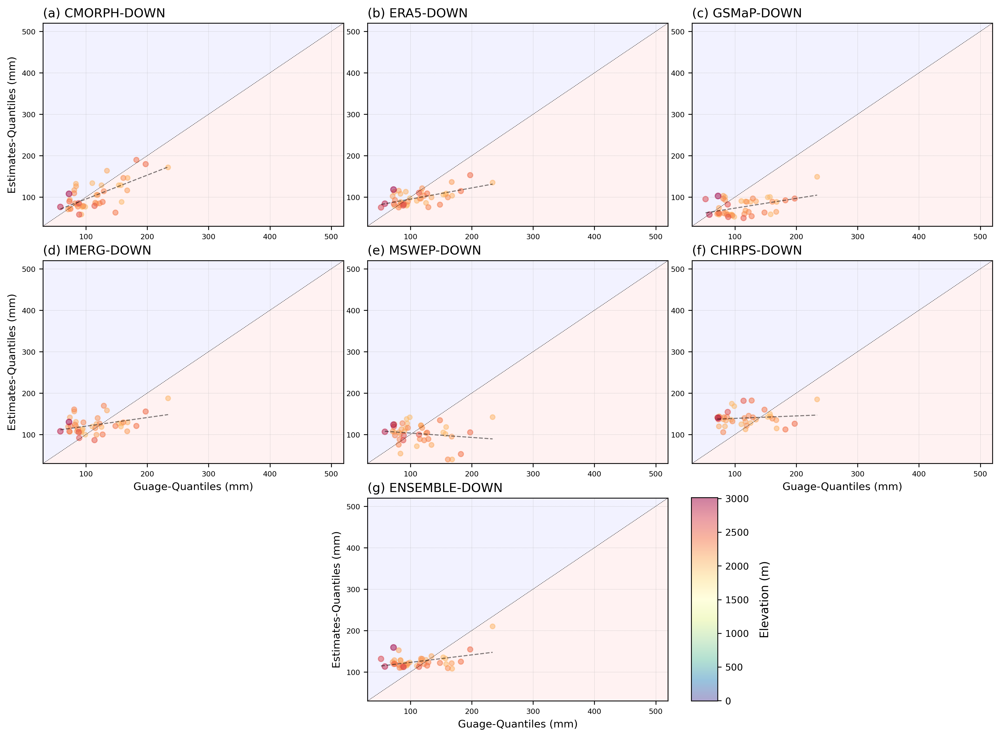

In [98]:
fig = plt.figure(figsize=(14,10),dpi=300)
gs = gridspec.GridSpec(3,3)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    CMORPH_OBS_Q50[(CMORPH_OBS_elev>=elevation_min)&(CMORPH_OBS_elev<elevation_max)], 
    CMORPH_DOWN_Q50[(CMORPH_OBS_elev>=elevation_min)&(CMORPH_OBS_elev<elevation_max)],
    alpha=0.5,
    s=CMORPH_OBS_ELEV_norm[(CMORPH_OBS_elev>=elevation_min)&(CMORPH_OBS_elev<elevation_max)],
    c=CMORPH_OBS_elev[(CMORPH_OBS_elev>=elevation_min)&(CMORPH_OBS_elev<elevation_max)],
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(CMORPH_SAT_x, CMORPH_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(a) CMORPH-DOWN', loc='left', fontsize=12)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    ERA5_OBS_Q50[(ERA5_OBS_elev>=elevation_min)&(ERA5_OBS_elev<elevation_max)], ERA5_DOWN_Q50[(ERA5_OBS_elev>=elevation_min)&(ERA5_OBS_elev<elevation_max)],
    alpha=0.5,
    s=ERA5_OBS_ELEV_norm[(ERA5_OBS_elev>=elevation_min)&(ERA5_OBS_elev<elevation_max)],
    c=ERA5_OBS_elev[(ERA5_OBS_elev>=elevation_min)&(ERA5_OBS_elev<elevation_max)],
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(ERA5_SAT_x, ERA5_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(b) ERA5-DOWN', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    GSMaP_OBS_Q50[(GSMaP_OBS_elev>=elevation_min)&(GSMaP_OBS_elev<elevation_max)], GSMaP_DOWN_Q50[(GSMaP_OBS_elev>=elevation_min)&(GSMaP_OBS_elev<elevation_max)],
    alpha=0.5,
    s=GSMaP_OBS_ELEV_norm[(GSMaP_OBS_elev>=elevation_min)&(GSMaP_OBS_elev<elevation_max)],
    c=GSMaP_OBS_elev[(GSMaP_OBS_elev>=elevation_min)&(GSMaP_OBS_elev<elevation_max)],
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(GSMaP_SAT_x, GSMaP_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(c) GSMaP-DOWN', loc='left', fontsize=12)

# ============================================================================================================================
# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    IMERG_OBS_Q50[(IMERG_OBS_elev>=elevation_min)&(IMERG_OBS_elev<elevation_max)], IMERG_DOWN_Q50[(IMERG_OBS_elev>=elevation_min)&(IMERG_OBS_elev<elevation_max)],
    alpha=0.5,
    s=IMERG_OBS_ELEV_norm[(IMERG_OBS_elev>=elevation_min)&(IMERG_OBS_elev<elevation_max)],
    c=IMERG_OBS_elev[(IMERG_OBS_elev>=elevation_min)&(IMERG_OBS_elev<elevation_max)],
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(IMERG_SAT_x, IMERG_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(d) IMERG-DOWN', loc='left', fontsize=12)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=10)
ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 1])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    MSWEP_OBS_Q50[(MSWEP_OBS_elev>=elevation_min)&(MSWEP_OBS_elev<elevation_max)], MSWEP_DOWN_Q50[(MSWEP_OBS_elev>=elevation_min)&(MSWEP_OBS_elev<elevation_max)],
    alpha=0.5,
    s=MSWEP_OBS_ELEV_norm[(MSWEP_OBS_elev>=elevation_min)&(MSWEP_OBS_elev<elevation_max)],
    c=MSWEP_OBS_elev[(MSWEP_OBS_elev>=elevation_min)&(MSWEP_OBS_elev<elevation_max)],
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(MSWEP_SAT_x, MSWEP_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(e) MSWEP-DOWN', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 2])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    CHIRPS_OBS_Q50[(CHIRPS_OBS_elev>=elevation_min)&(CHIRPS_OBS_elev<elevation_max)], CHIRPS_DOWN_Q50[(CHIRPS_OBS_elev>=elevation_min)&(CHIRPS_OBS_elev<elevation_max)],
    alpha=0.5,
    s=CHIRPS_OBS_ELEV_norm[(CHIRPS_OBS_elev>=elevation_min)&(CHIRPS_OBS_elev<elevation_max)],
    c=CHIRPS_OBS_elev[(CHIRPS_OBS_elev>=elevation_min)&(CHIRPS_OBS_elev<elevation_max)],
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(CHIRPS_SAT_x, CHIRPS_SAT_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(f) CHIRPS-DOWN', loc='left', fontsize=12)
ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
ax1 = plt.subplot(gs[2, 1])
ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.3, label='Identity line')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.set_xlim(30,val_remove+20)
ax1.set_ylim(30,val_remove+20)

ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

a1 = ax1.scatter(
    ENSEMBLE_OBS_Q50[(ENSEMBLE_OBS_elev>=elevation_min)&(ENSEMBLE_OBS_elev<elevation_max)], ENSEMBLE_DOWN_Q50[(ENSEMBLE_OBS_elev>=elevation_min)&(ENSEMBLE_OBS_elev<elevation_max)],
    alpha=0.5,
    s=ENSEMBLE_OBS_ELEV_norm[(ENSEMBLE_OBS_elev>=elevation_min)&(ENSEMBLE_OBS_elev<elevation_max)],
    c=ENSEMBLE_OBS_elev[(ENSEMBLE_OBS_elev>=elevation_min)&(ENSEMBLE_OBS_elev<elevation_max)],
    vmin=vmin, vmax=vmax,
    cmap="Spectral_r"
)

ax1.plot(ENSEMBLE_DOWN_x, ENSEMBLE_DOWN_y, "--k", linewidth=1, label="Linear Fit", alpha=0.5)

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()
x_vals = np.linspace(min(xlim[0], ylim[0]), max(xlim[1], ylim[1]), 200)
ax1.fill_between(x_vals, ylim[0], x_vals, facecolor="red", alpha=0.05, zorder=0)
ax1.fill_between(x_vals, x_vals, ylim[1], facecolor="blue", alpha=0.05, zorder=0)

ax1.set_title('(g) ENSEMBLE-DOWN', loc='left', fontsize=12)

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=10)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=10)

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.08, hspace=0.17)

# cbar_ax = fig.add_axes([0.96, 0.094, 0.03, 0.813])#0.96
# cbar = fig.colorbar(a1, cax=cbar_ax, orientation='vertical')
# cbar.ax.tick_params(labelsize=9)
# cbar.set_label("Elevation (m)", fontsize=11, labelpad=10)  

cbar_ax = fig.add_axes([0.6645, 0.05, 0.025, 0.27])#0.96
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=9)
cbar.set_label("Elevation (m)", fontsize=11, labelpad=10)  


In [99]:
vals = CMORPH_OBS_Q50[(CMORPH_OBS_elev>=elevation_min)&(CMORPH_OBS_elev<elevation_max)]
sorted_vals = np.sort(vals)
cdf = np.arange(1, len(sorted_vals) + 1) / len(sorted_vals)

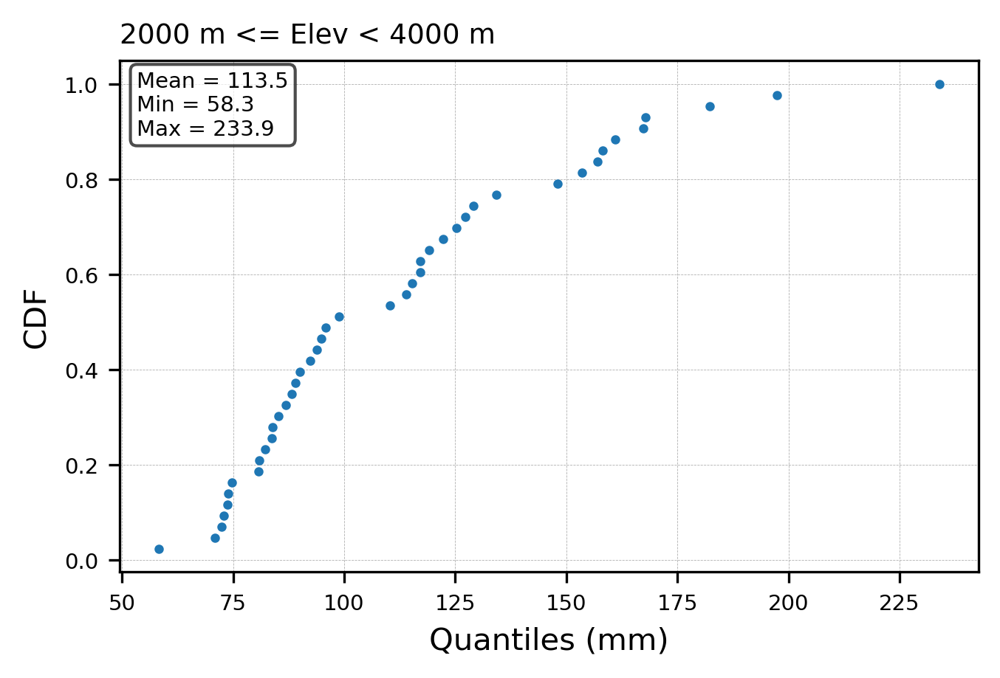

In [100]:
fig = plt.figure(figsize=(5,3),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.plot(sorted_vals, cdf, marker=".", linestyle="none", markersize=4)

stats_text = (
    f"Mean = {np.nanmean(vals):.1f}\n"
    f"Min = {np.nanmin(vals):.1f}\n"
    f"Max = {np.nanmax(vals):.1f}"
)

ax1.text(
    0.02, 0.98, stats_text,
    transform=ax1.transAxes,   # usa coordenadas relativas del eje
    fontsize=7,
    va="top", ha="left",
    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="black", alpha=0.7)
)

ax1.set_xlabel("Quantiles (mm)")
ax1.set_ylabel("CDF")
ax1.set_title(f'{elevation_min} m <= Elev < {elevation_max} m', loc='left', fontsize=9)
ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

In [101]:
Q_val = 300
vals = CMORPH_OBS_elev[CMORPH_OBS_Q50 >= Q_val]
sorted_vals = np.sort(vals)
cdf = np.arange(1, len(sorted_vals) + 1) / len(sorted_vals)

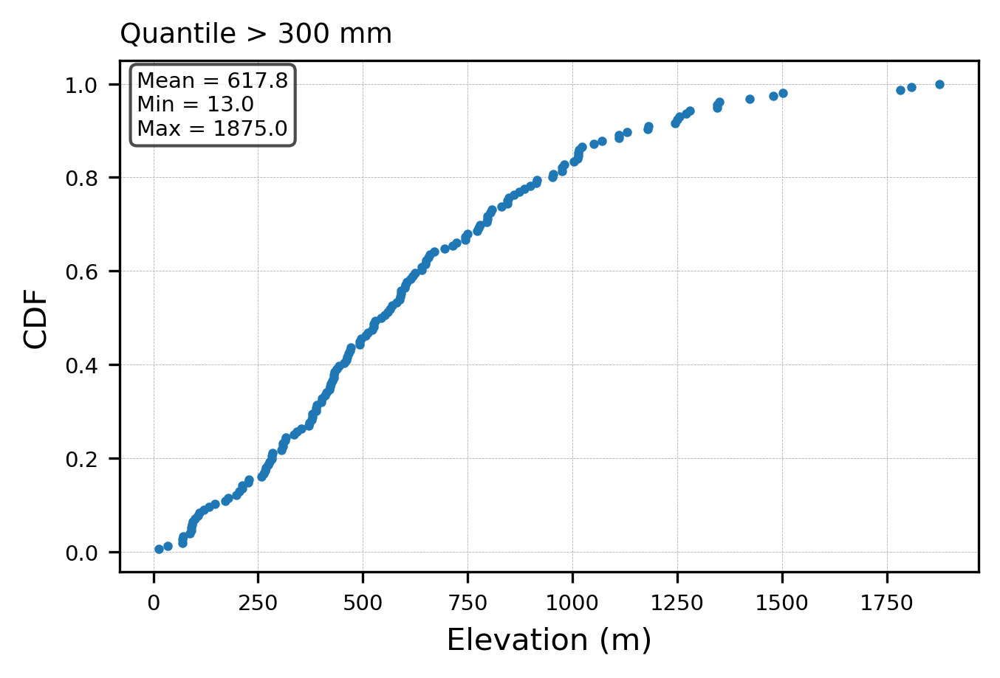

In [102]:
fig = plt.figure(figsize=(5,3),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.plot(sorted_vals, cdf, marker=".", linestyle="none", markersize=4)

stats_text = (
    f"Mean = {np.nanmean(MSWEP_OBS_elev[MSWEP_OBS_Q50 >= Q_val]):.1f}\n"
    f"Min = {np.nanmin(MSWEP_OBS_elev[MSWEP_OBS_Q50 >= Q_val]):.1f}\n"
    f"Max = {np.nanmax(MSWEP_OBS_elev[MSWEP_OBS_Q50 >= Q_val]):.1f}"
)

ax1.text(
    0.02, 0.98, stats_text,
    transform=ax1.transAxes,   # usa coordenadas relativas del eje
    fontsize=7,
    va="top", ha="left",
    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="black", alpha=0.7)
)

ax1.set_xlabel("Elevation (m)")
ax1.set_ylabel("CDF")
ax1.set_title(f'Quantile > {Q_val} mm', loc='left', fontsize=9)
ax1.grid(linestyle='--', linewidth=0.2)
ax1.tick_params(axis='both', which='major', labelsize=7)

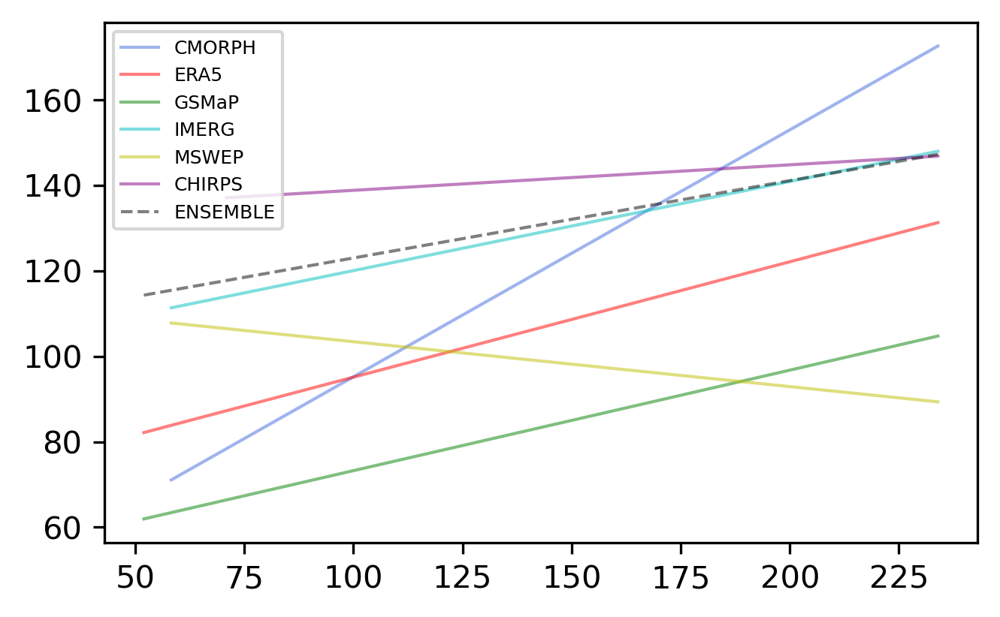

In [103]:
fig = plt.figure(figsize=(5,3),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

ax1.plot(CMORPH_SAT_x, CMORPH_SAT_y, c=colors[0], linewidth=1, label="CMORPH", alpha=0.5)
ax1.plot(ERA5_SAT_x, ERA5_SAT_y, c=colors[1], linewidth=1, label="ERA5", alpha=0.5)
ax1.plot(GSMaP_SAT_x, GSMaP_SAT_y, c=colors[2], linewidth=1, label="GSMaP", alpha=0.5)
ax1.plot(IMERG_SAT_x, IMERG_SAT_y, c=colors[3], linewidth=1, label="IMERG", alpha=0.5)
ax1.plot(MSWEP_SAT_x, MSWEP_SAT_y, c=colors[4], linewidth=1, label="MSWEP", alpha=0.5)
ax1.plot(CHIRPS_SAT_x, CHIRPS_SAT_y, c=colors[5], linewidth=1, label="CHIRPS", alpha=0.5)
ax1.plot(ENSEMBLE_DOWN_x, ENSEMBLE_DOWN_y, "--k", linewidth=1, label="ENSEMBLE", alpha=0.5)
plt.legend(fontsize=6)

In [104]:
CMORPH_OBS_elev, CMORPH_OBS_Q50, CMORPH_DOWN_Q50, CMORPH_OBS_ELEV_norm = clear_dict('CMORPH')
ERA5_OBS_elev, ERA5_OBS_Q50, ERA5_DOWN_Q50, ERA5_OBS_ELEV_norm = clear_dict('ERA5')
GSMaP_OBS_elev, GSMaP_OBS_Q50, GSMaP_DOWN_Q50, GSMaP_OBS_ELEV_norm = clear_dict('GSMaP')
MSWEP_OBS_elev, MSWEP_OBS_Q50, MSWEP_DOWN_Q50, MSWEP_OBS_ELEV_norm = clear_dict('MSWEP')
IMERG_OBS_elev, IMERG_OBS_Q50, IMERG_DOWN_Q50, IMERG_OBS_ELEV_norm = clear_dict('IMERG')
CHIRPS_OBS_elev, CHIRPS_OBS_Q50, CHIRPS_DOWN_Q50, CHIRPS_OBS_ELEV_norm = clear_dict('CHIRPS')

ENSEMBLE_OBS_elev, ENSEMBLE_OBS_Q50, ENSEMBLE_DOWN_Q50, ENSEMBLE_OBS_ELEV_norm = clear_dict('ensemble')

In [105]:
Q50_min = 300

CMORPH_OBS_elev_filter = CMORPH_OBS_elev[CMORPH_OBS_Q50>Q50_min]

ERA5_OBS_elev_filter = ERA5_OBS_elev[ERA5_OBS_Q50>Q50_min]

GSMaP_OBS_elev_filter = GSMaP_OBS_elev[GSMaP_OBS_Q50>Q50_min]

MSWEP_OBS_elev_filter = MSWEP_OBS_elev[MSWEP_OBS_Q50>Q50_min]

IMERG_OBS_elev_filter = IMERG_OBS_elev[IMERG_OBS_Q50>Q50_min]

CHIRPS_OBS_elev_filter = CHIRPS_OBS_elev[CHIRPS_OBS_Q50>Q50_min]

ENSEMBLE_OBS_elev_filter = ENSEMBLE_OBS_elev[ENSEMBLE_OBS_Q50>Q50_min]

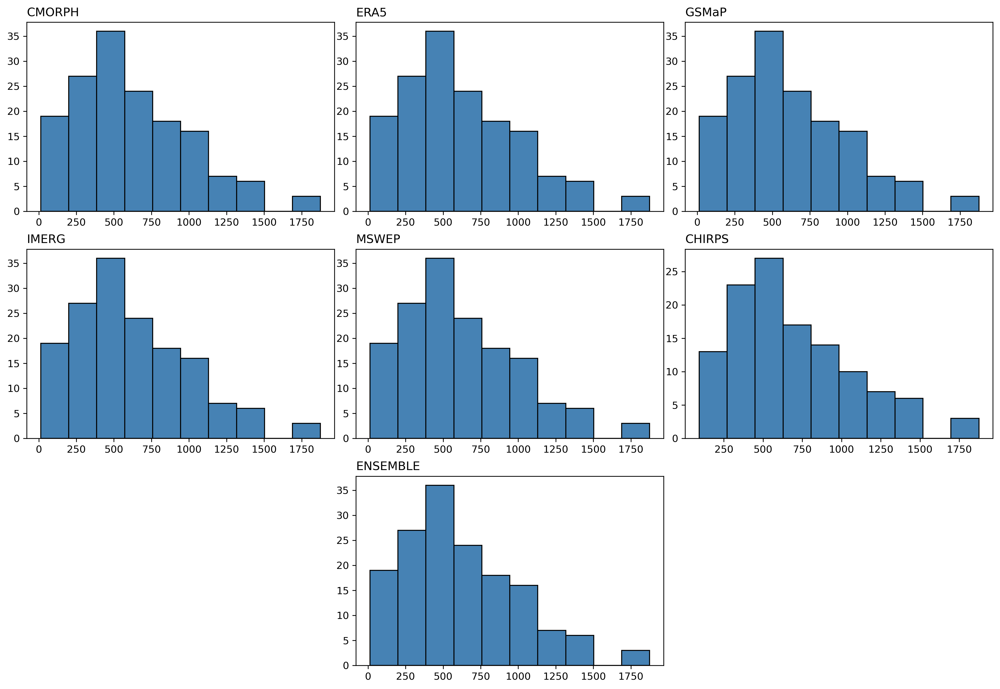

In [106]:
fig = plt.figure(figsize=(15,10),dpi=300)
gs = gridspec.GridSpec(3,3)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

ax1.hist(CMORPH_OBS_elev_filter, bins=10, color='steelblue', edgecolor='black')

ax1.set_title('CMORPH', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1])

ax1.hist(ERA5_OBS_elev_filter, bins=10, color='steelblue', edgecolor='black')

ax1.set_title('ERA5', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2])

ax1.hist(GSMaP_OBS_elev_filter, bins=10, color='steelblue', edgecolor='black')

ax1.set_title('GSMaP', loc='left', fontsize=12)

# ============================================================================================================================
# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])

ax1.hist(MSWEP_OBS_elev_filter, bins=10, color='steelblue', edgecolor='black')

ax1.set_title('IMERG', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 1])

ax1.hist(IMERG_OBS_elev_filter, bins=10, color='steelblue', edgecolor='black')

ax1.set_title('MSWEP', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 2])

ax1.hist(CHIRPS_OBS_elev_filter, bins=10, color='steelblue', edgecolor='black')

ax1.set_title('CHIRPS', loc='left', fontsize=12)

# ============================================================================================================================
ax1 = plt.subplot(gs[2, 1])

ax1.hist(ENSEMBLE_OBS_elev_filter, bins=10, color='steelblue', edgecolor='black')

ax1.set_title('ENSEMBLE', loc='left', fontsize=12)

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.07, hspace=0.2)